# Predicting Appliance Energy Consumption in Households

In [1]:
!pip install missingno
!pip install lightgbm

In [97]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
%matplotlib inline


from datetime import datetime

import warnings

warnings.filterwarnings('ignore')

# Import necessary statistical libraries
import scipy.stats as stats
import statsmodels.api as sm
from scipy.stats import norm

# Import libraries for ML Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, ExtraTreesRegressor, RandomForestRegressor, StackingRegressor
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
import lightgbm
from lightgbm import LGBMRegressor

import pickle


In [98]:
energydata = pd.read_csv(r"C:\Users\ACER\Downloads\energydata.csv")

In [99]:
energydata.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,11-01-2016 17:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.60,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,11-01-2016 17:10,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.48,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,11-01-2016 17:20,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.37,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,11-01-2016 17:30,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.25,733.8,92.0,6.000000,51.500000,5.0,45.410390,45.410390
4,11-01-2016 17:40,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.13,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [100]:
rows, columns = energydata.shape
print(f'The dataset has {rows} rows and {columns} columns.')

The dataset has 19735 rows and 29 columns.


In [101]:
energydata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

# Missing Values

In [102]:
energydata.isnull().sum()

date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

# All the values is 0 means do not have missing values in dataset

In [103]:
energydata.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.412580,755.522602,79.750418,4.039752,38.330834,3.760995,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.318464,7.399441,14.901088,2.451221,11.794719,4.195248,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.670000,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.920000,756.100000,83.666667,3.666667,40.000000,3.430000,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.400000,760.933333,91.666667,5.500000,40.000000,6.570000,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [104]:
energydata.duplicated().sum()

0

Understanding Variables

In [105]:
energydata.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [106]:
energydata.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.412580,755.522602,79.750418,4.039752,38.330834,3.760995,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.318464,7.399441,14.901088,2.451221,11.794719,4.195248,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.670000,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.920000,756.100000,83.666667,3.666667,40.000000,3.430000,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.400000,760.933333,91.666667,5.500000,40.000000,6.570000,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


Variable Description

date time year-month-day hour: minute: second

Appliances, energy use in Wh (target variable for prediction)

lights, energy use of light fixtures in the house in Wh

T1, Temperature in kitchen area, in Celsius

RH_1, Humidity in kitchen area, in %

T2, Temperature in living room area, in Celsius

RH_2, Humidity in living room area, in %

T3, Temperature in laundry room area

RH_3, Humidity in laundry room area, in %

T4, Temperature in office room, in Celsius

RH_4, Humidity in office room, in %

T5, Temperature in bathroom, in Celsius

RH_5, Humidity in bathroom, in %

T6, Temperature outside the building (north side), in Celsius

RH_6, Humidity outside the building (north side), in %

T7, Temperature in ironing room , in Celsius

RH_7, Humidity in ironing room, in %

T8, Temperature in teenager room 2, in Celsius

RH_8, Humidity in teenager room 2, in %

T9, Temperature in parents room, in Celsius

RH_9, Humidity in parents room, in %

To, Temperature outside (from Chievres weather station), in Celsius

Pressure (from Chievres weather station), in mm Hg

RH_out, Humidity outside (from Chievres weather station), in %

Wind speed (from Chievres weather station), in m/s

Visibility (from Chievres weather station), in km

Tdewpoint (from Chievres weather station), Â°C

rv1, Random variable 1, nondimensional

rv2, Random variable 2, nondimensional

# Check Unique Values for each Variable

In [107]:
def get_uniquevalues(dfi):
    unique_values = dfi.apply(pd.Series.unique)
    return unique_values

unq_values = get_uniquevalues(energydata)

for i in energydata.columns.tolist():
    print("No. of unique values in", i, "is", energydata[i].nunique())


No. of unique values in date is 19735
No. of unique values in Appliances is 92
No. of unique values in lights is 8
No. of unique values in T1 is 722
No. of unique values in RH_1 is 2547
No. of unique values in T2 is 1650
No. of unique values in RH_2 is 3376
No. of unique values in T3 is 1426
No. of unique values in RH_3 is 2618
No. of unique values in T4 is 1390
No. of unique values in RH_4 is 2987
No. of unique values in T5 is 2263
No. of unique values in RH_5 is 7571
No. of unique values in T6 is 4446
No. of unique values in RH_6 is 9708
No. of unique values in T7 is 1955
No. of unique values in RH_7 is 5891
No. of unique values in T8 is 2228
No. of unique values in RH_8 is 6649
No. of unique values in T9 is 924
No. of unique values in RH_9 is 3388
No. of unique values in T_out is 1055
No. of unique values in Press_mm_hg is 2189
No. of unique values in RH_out is 566
No. of unique values in Windspeed is 189
No. of unique values in Visibility is 412
No. of unique values in Tdewpoint is

# Data Wrangling

In [108]:
df_energy = energydata.copy()
df_energy.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,11-01-2016 17:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.60,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,11-01-2016 17:10,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.48,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,11-01-2016 17:20,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.37,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,11-01-2016 17:30,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.25,733.8,92.0,6.000000,51.500000,5.0,45.410390,45.410390
4,11-01-2016 17:40,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.13,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [109]:
# rename the columns
df_energy.rename(columns={"T1":"temp_kitchen", "RH_1":"hu_kitchen", "T2":"temp_living_room", 
                          "RH_2":"hu_living", "T3":"temp_Laundry_room", "RH_3":"hu_laundry", 
                          "T4":"temp_office_room", "RH_4":"hu_office", "T5":"temp_bathroom", 
                          "RH_5":"hu_bath", "T6":"temp_build_out", "RH_6":"hu_build_out", 
                          "T7":"temp_ironing_room", "RH_7":"hu_ironing_room", 
                          "T8":"temp_teen_room", "RH_8":"hu_teen", "T9":"temp_parents_room", 
                          "RH_9":"hu_parent", "T_out":"temp_out", "RH_out":"out_humidity"}, inplace=True)


In [110]:
df_energy.columns

Index(['date', 'Appliances', 'lights', 'temp_kitchen', 'hu_kitchen',
       'temp_living_room', 'hu_living', 'temp_Laundry_room', 'hu_laundry',
       'temp_office_room', 'hu_office', 'temp_bathroom', 'hu_bath',
       'temp_build_out', 'hu_build_out', 'temp_ironing_room',
       'hu_ironing_room', 'temp_teen_room', 'hu_teen', 'temp_parents_room',
       'hu_parent', 'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [111]:
df_energy.head()

,date,Appliances,lights,temp_kitchen,hu_kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,...,temp_parents_room,hu_parent,temp_out,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,11-01-2016 17:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.60,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,11-01-2016 17:10,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.48,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,11-01-2016 17:20,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.37,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,11-01-2016 17:30,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.25,733.8,92.0,6.000000,51.500000,5.0,45.410390,45.410390
4,11-01-2016 17:40,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.13,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [112]:
df_energy.describe()

,Appliances,lights,temp_kitchen,hu_kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,hu_office,...,temp_parents_room,hu_parent,temp_out,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.412580,755.522602,79.750418,4.039752,38.330834,3.760995,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.318464,7.399441,14.901088,2.451221,11.794719,4.195248,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.670000,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.920000,756.100000,83.666667,3.666667,40.000000,3.430000,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.400000,760.933333,91.666667,5.500000,40.000000,6.570000,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [113]:
import pandas as pd

# Convert the 'date' column to datetime, assuming day comes first in the date format
df_energy['date'] = pd.to_datetime(df_energy['date'], dayfirst=True)

# Getting the months, weekdays, and hours from the 'date' column
df_energy['month'] = df_energy['date'].dt.month
df_energy['weekday'] = df_energy['date'].dt.weekday
df_energy['hour'] = df_energy['date'].dt.hour

# Drop the 'date' column if it's no longer needed
df_energy.drop('date', axis=1, inplace=True)

df_energy.head()


,Appliances,lights,temp_kitchen,hu_kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,hu_office,...,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,weekday,hour
0,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,1,0,17
1,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,1,0,17
2,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,1,0,17
3,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,733.8,92.0,6.000000,51.500000,5.0,45.410390,45.410390,1,0,17
4,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097,1,0,17


In [114]:
# separate column list for better analysis
temp_cols = ['temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room',
             'temp_bathroom','temp_build_out','temp_ironing_room','temp_teen_room',
             'temp_parents_room']
hu_cols = ['hu_kitchen','hu_living','hu_laundry','hu_office','hu_bath','hu_build_out',
           'hu_ironing_room','hu_teen','hu_parent']
light_cols = ['light']
weather_cols = ['temp_out','out_humidity','Tdewpoint','Press_mm_hg','Windspeed','Visibility']
date_col = ['month','weekday','hour']
random_col = ['rv1','rv2']


In [115]:
df_energy.head()


,Appliances,lights,temp_kitchen,hu_kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,hu_office,...,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,weekday,hour
0,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,1,0,17
1,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,1,0,17
2,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,1,0,17
3,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,733.8,92.0,6.000000,51.500000,5.0,45.410390,45.410390,1,0,17
4,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097,1,0,17


# Exploratory Data Analysis

<Axes: xlabel='Appliances', ylabel='Density'>

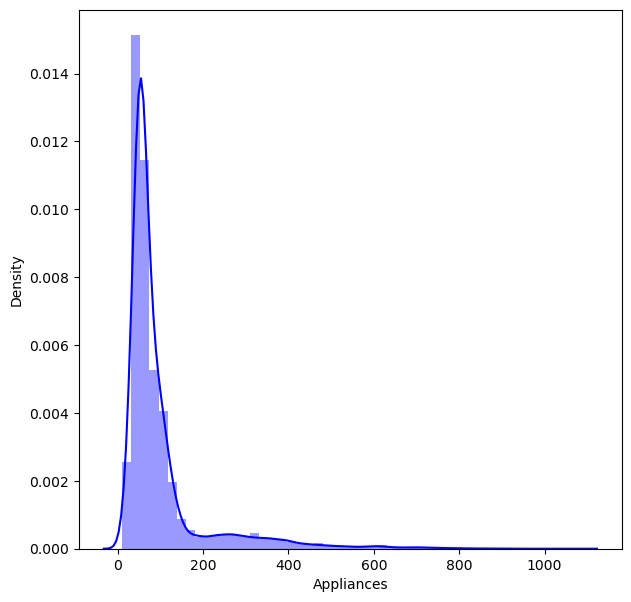

In [116]:
plt.figure(figsize = (7,7))
sns.distplot(df_energy['Appliances'], color = 'Blue')

As we can see the Data is right-squared sitplot to check the distribution of the dependent Variable 'Appliances'
the dependent variable Appliances has positive skweness that data is more likely distributed in the right hand side of the mean

<Axes: xlabel='Appliances', ylabel='Density'>

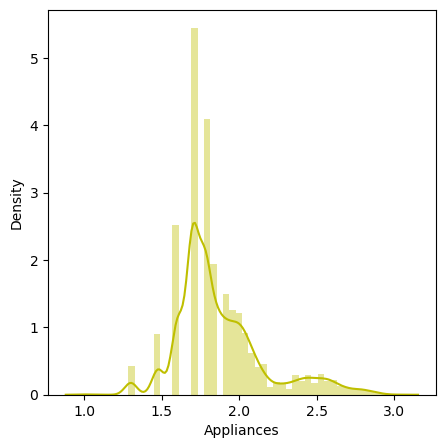

In [117]:
plt.figure(figsize = (5,5))
sns.distplot(np.log10(df_energy['Appliances']), color = "y")

# Default Title Text 

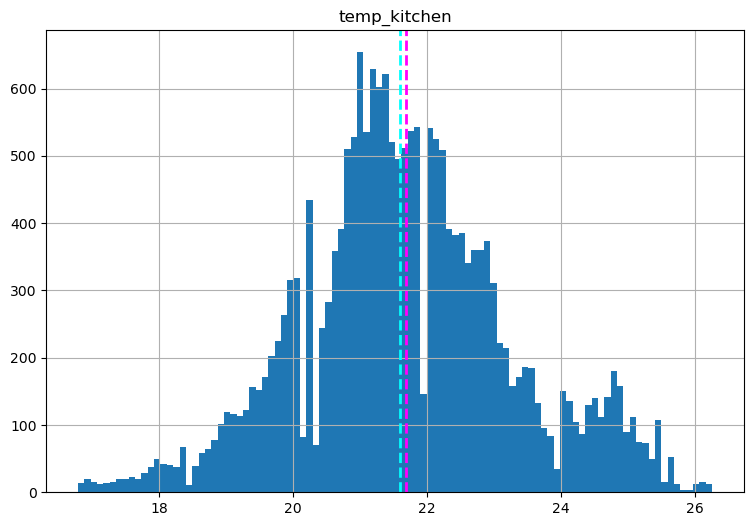

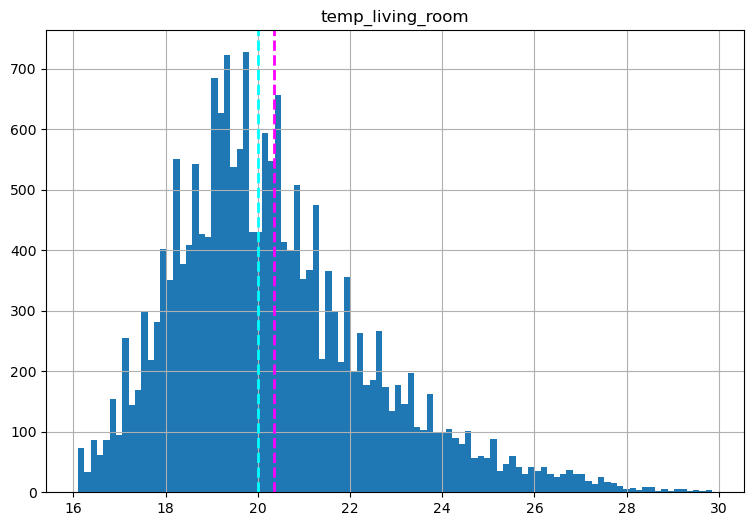

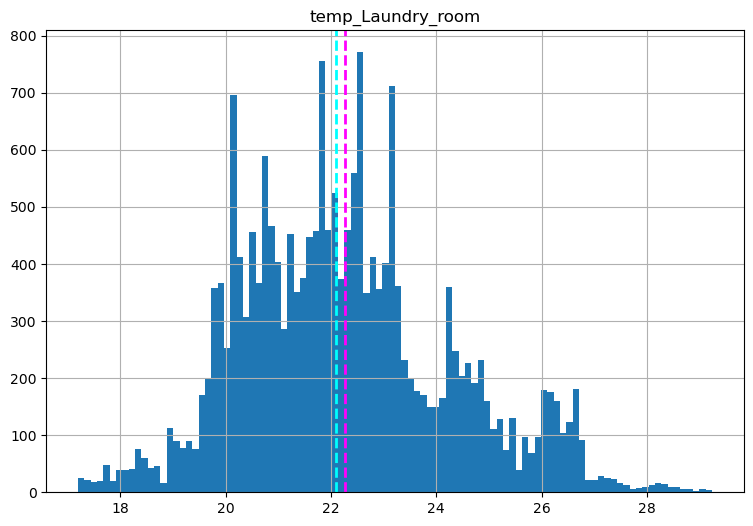

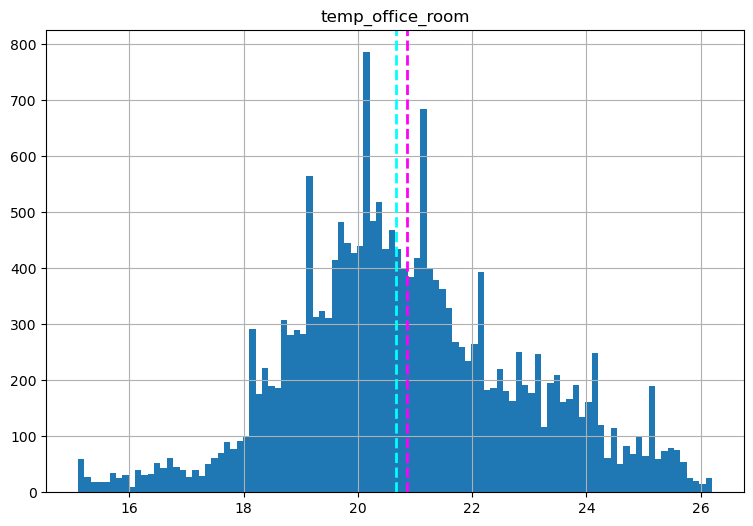

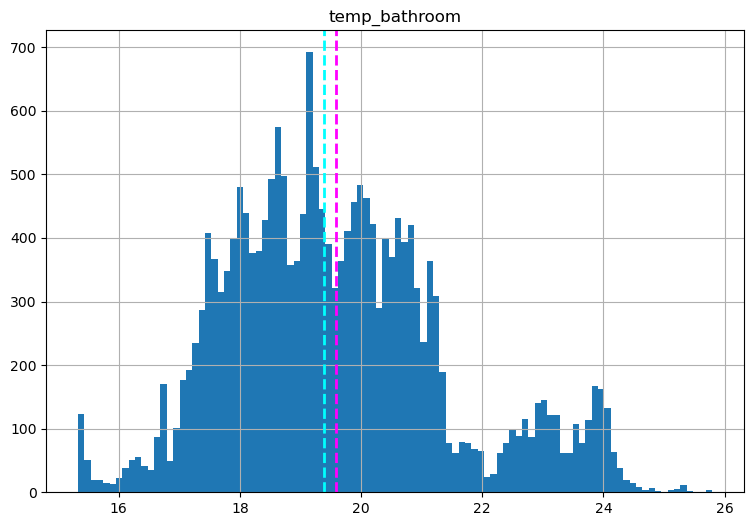

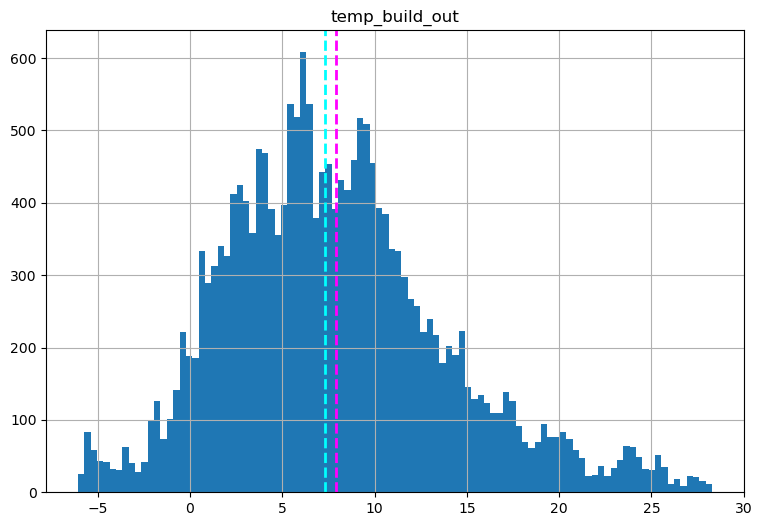

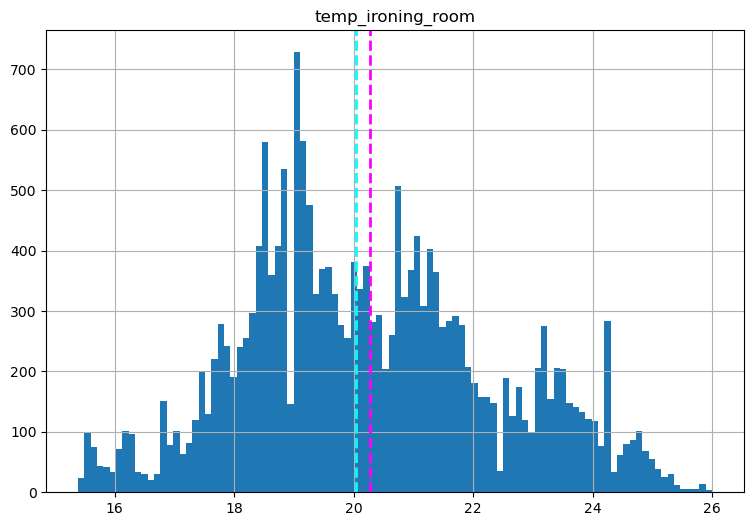

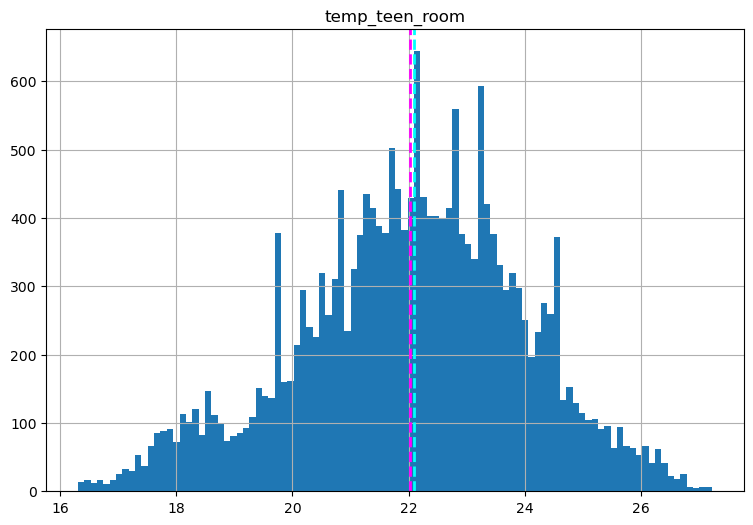

In [118]:
# plot a bar plot for each numerical feature count (except car_ID)
for col in temp_cols[:-1]:
    fig = plt.figure(figsize = (9, 6))
    ax = fig.gca()
    feature = (df_energy[col])
    feature.hist(bins = 100, ax = ax)
    ax.axvline(df_energy[col].mean(), color = 'magenta', linestyle = 'dashed', linewidth = 2)
    ax.axvline(feature.median(), color ='cyan', linestyle = 'dashed', linewidth = 2)
    
    ax.set_title(col)
    plt.show()



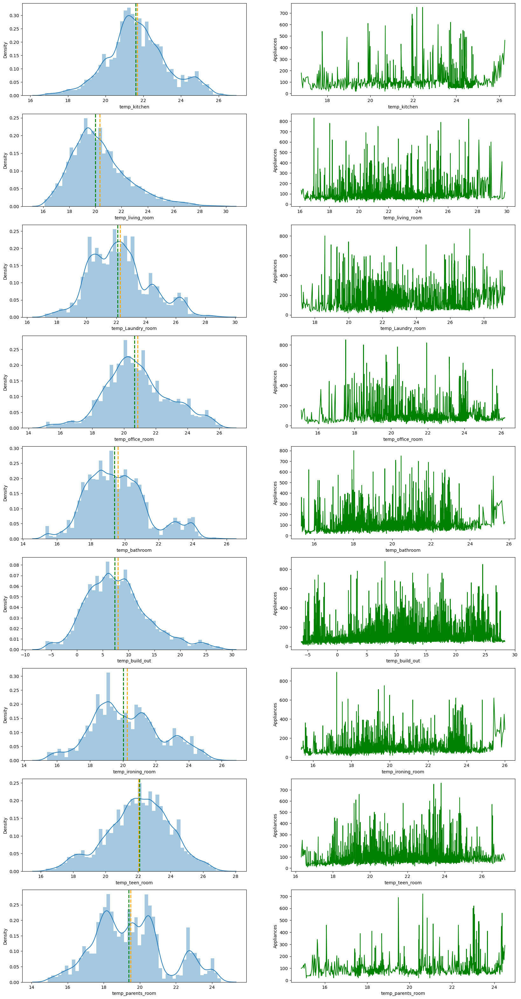

In [119]:
n = len(temp_cols)
fig, ax = plt.subplots(len(temp_cols), 2, figsize=(20, 40))

for i, col in enumerate(temp_cols):

    # Univariate of the columns
    dist = sns.distplot(df_energy[col], ax=ax[i, 0])
    ax[i, 0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
    ax[i, 0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)

    # Bivariate Analysis with Appliance Energy
    scatter = sns.lineplot(data=df_energy, x=col, y='Appliances', color='green', ax=ax[i, 1], ci=None)



In [120]:
for col in temp_cols:
    skewness = df_energy[col].skew(axis=0, skipna=True)
    print("The skewness of ", col, "is", skewness)

The skewness of  temp_kitchen is 0.1209171174014252
The skewness of  temp_living_room is 0.8896578498902614
The skewness of  temp_Laundry_room is 0.4507773350868688
The skewness of  temp_office_room is 0.1703840571035054
The skewness of  temp_bathroom is 0.5582196988590897
The skewness of  temp_build_out is 0.5974713395630404
The skewness of  temp_ironing_room is 0.25472241697640163
The skewness of  temp_teen_room is -0.2561511357902667
The skewness of  temp_parents_room is 0.382711239025606


# Skewness Number

The skewness number signifies how much it deviates from the normal distribution.
If skewness is less than -1 or greater than 1, the distribution is highly skewed. If skewness is between -1 and -0.5 or between 0.5 and 1, the distribution is moderately skewed. If skewness is between -0.5 and 0.5, the distribution is approximately symmetric.   
In our problem, most of the distributions follow a more likely normal distribution with moderate skewness.


# Correlation Heatmap

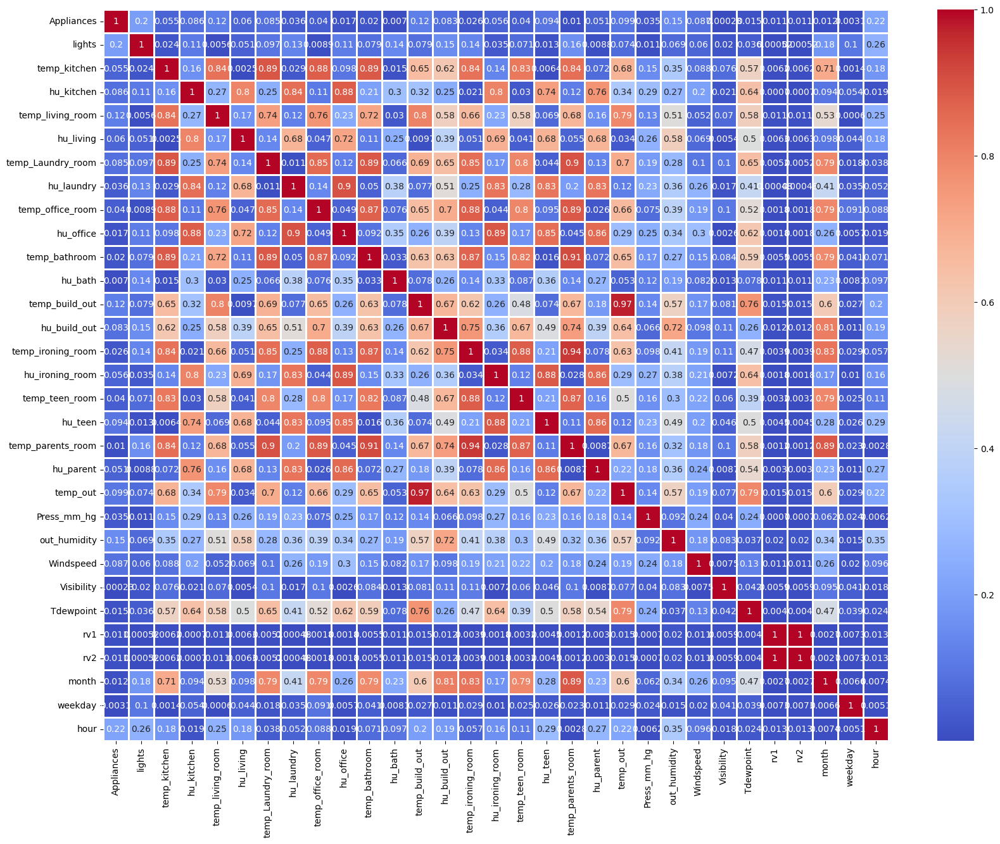

In [121]:
plt.figure(figsize = (20,15))
correlation = df_energy.corr()
sns.heatmap(abs(correlation),annot = True, cmap = 'coolwarm', linewidth = 1)
plt.show()

# Correlation map of Temperature columns

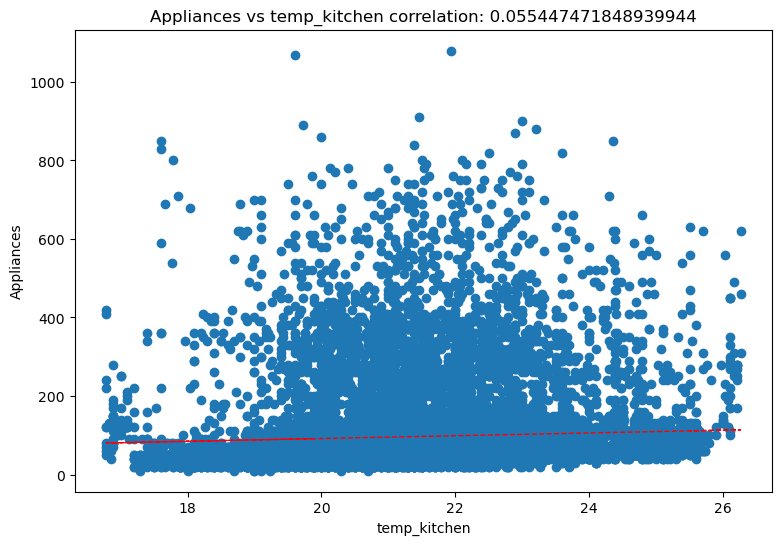

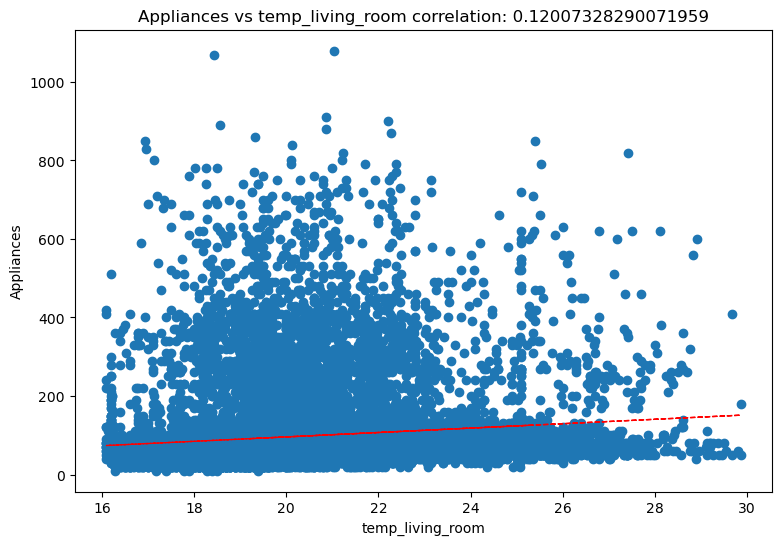

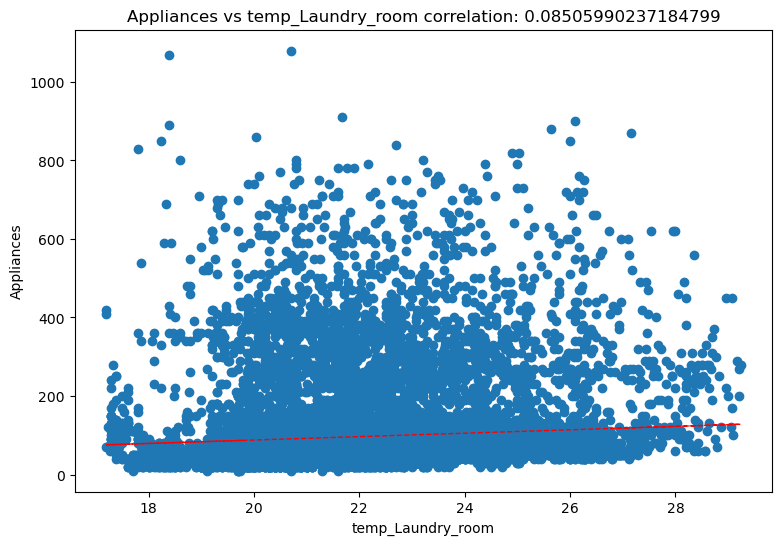

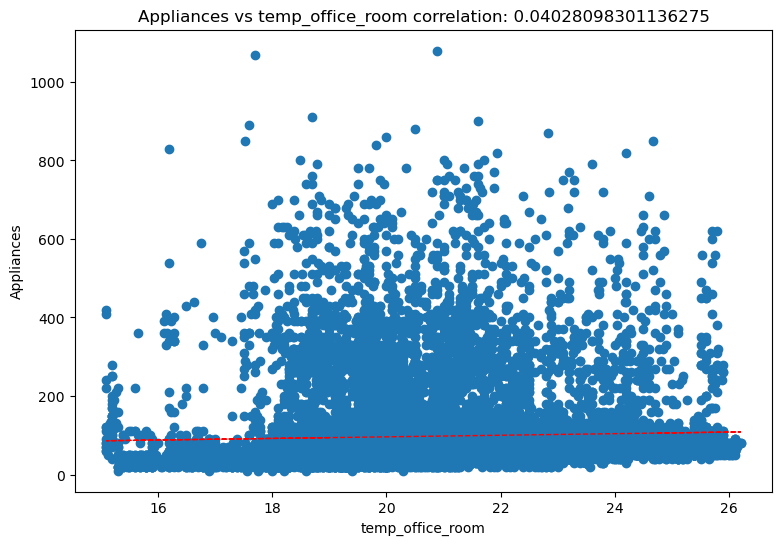

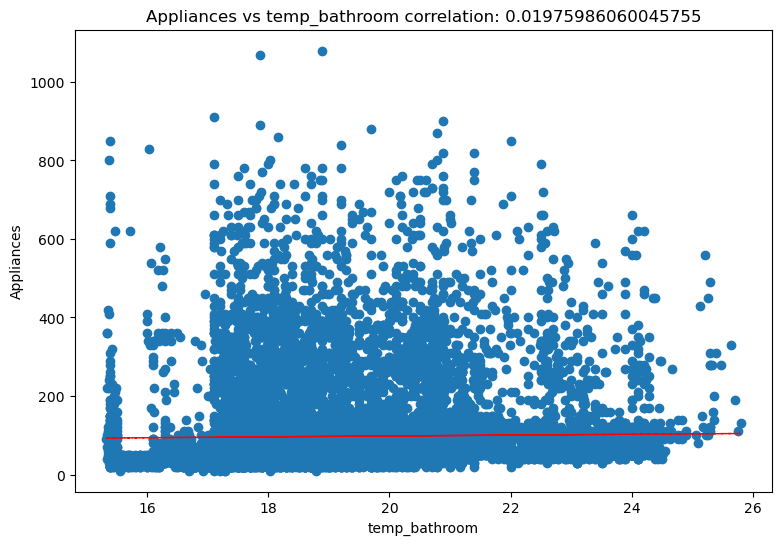

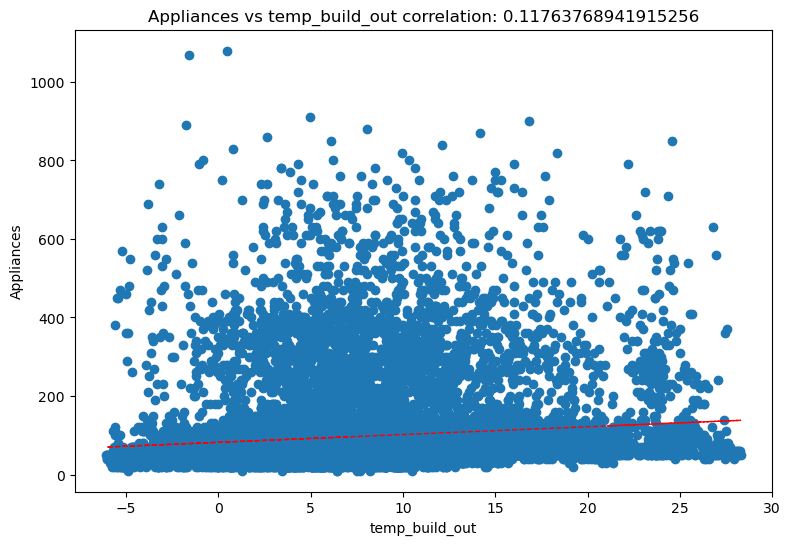

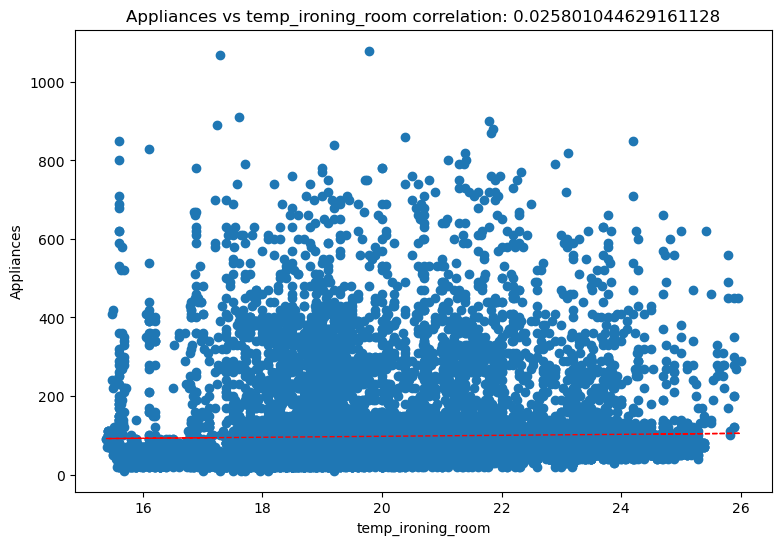

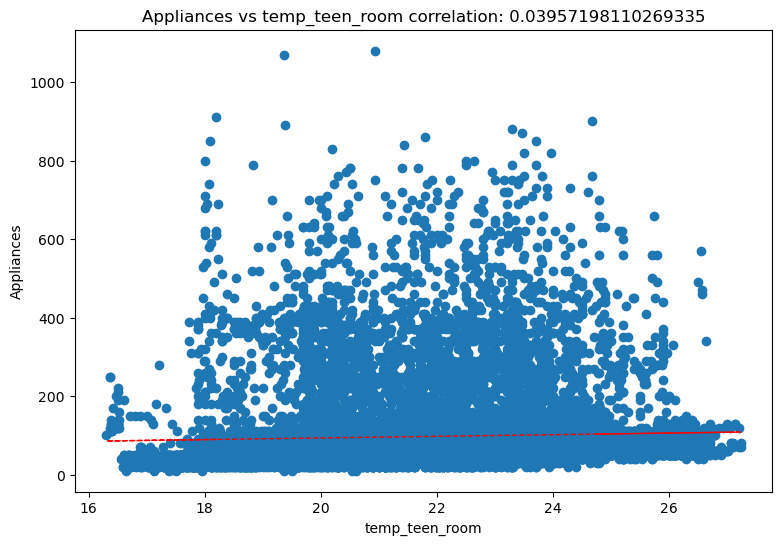

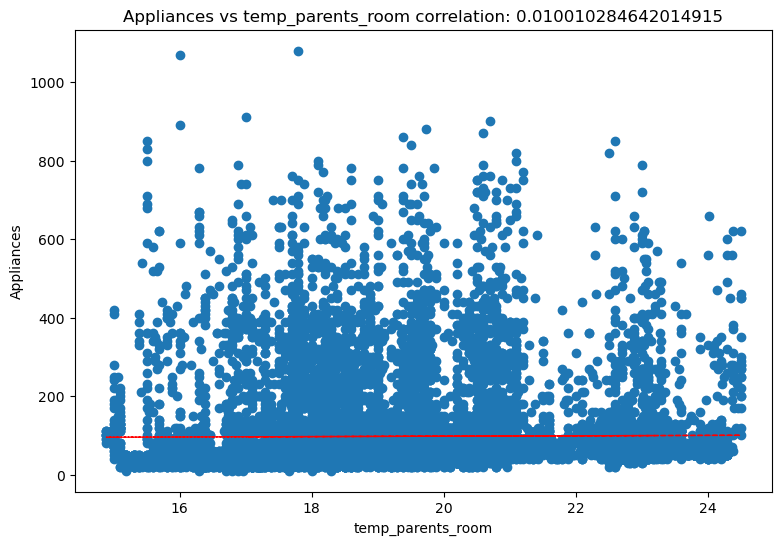

In [122]:
for col in temp_cols[:]:
    fig = plt.figure(figsize=(9,6))

    ax = fig.gca()
    feature = df_energy[col]

    label = df_energy['Appliances']
    correlation = feature.corr(label)

    plt.scatter(x = feature, y = label)
    plt.xlabel(col)

    plt.ylabel('Appliances')
    ax.set_title('Appliances vs ' + col + ' correlation: ' + str(correlation))

    z = np.polyfit(df_energy[col], df_energy['Appliances'], 1)
    y_hat = np.poly1d(z)(df_energy[col])

    plt.plot(df_energy[col], y_hat, "r--", lw = 1)

plt.show()

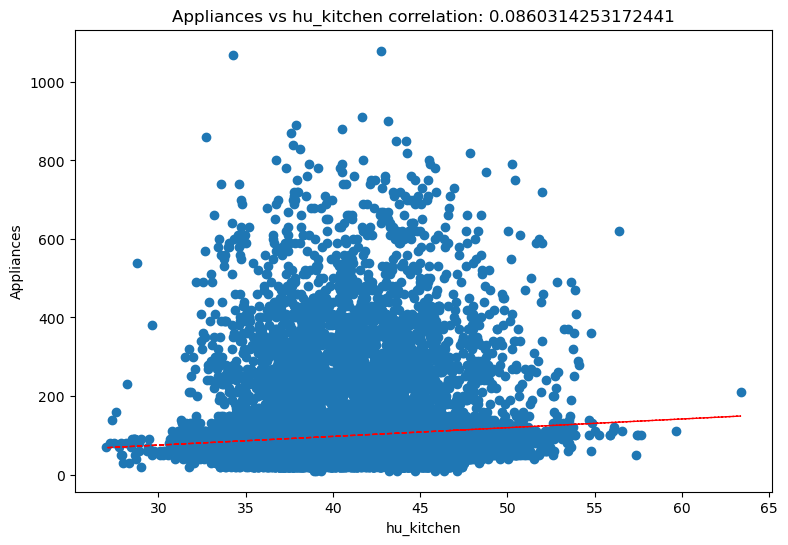

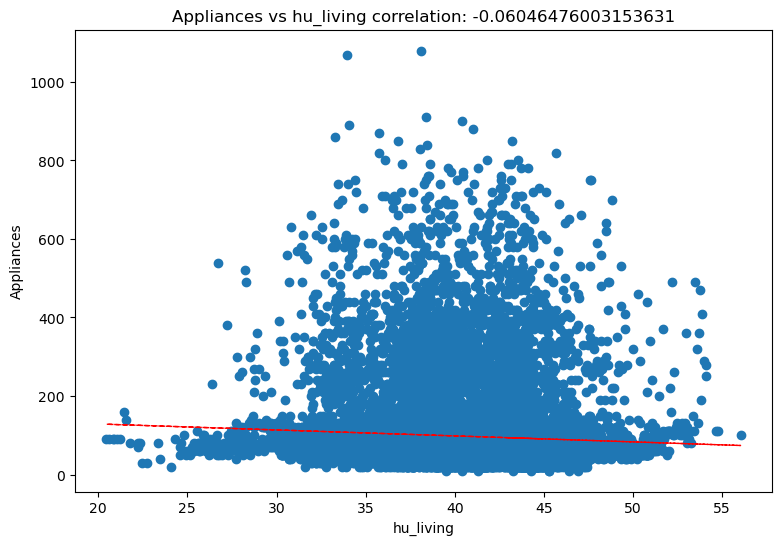

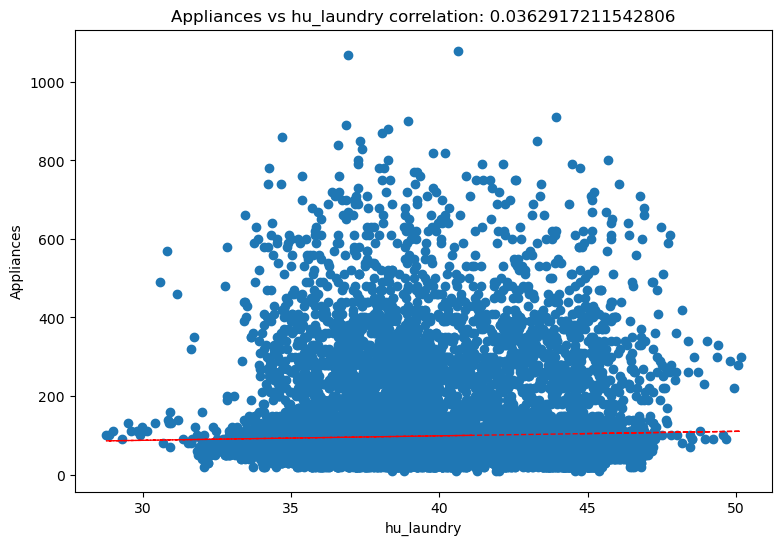

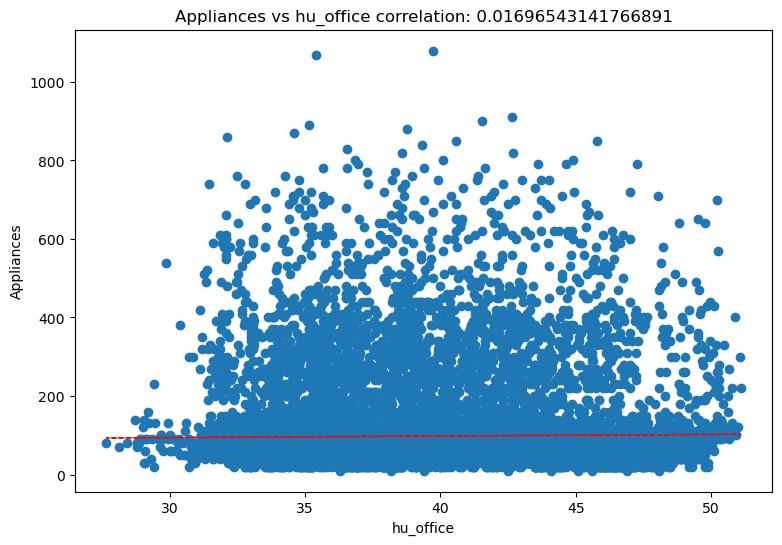

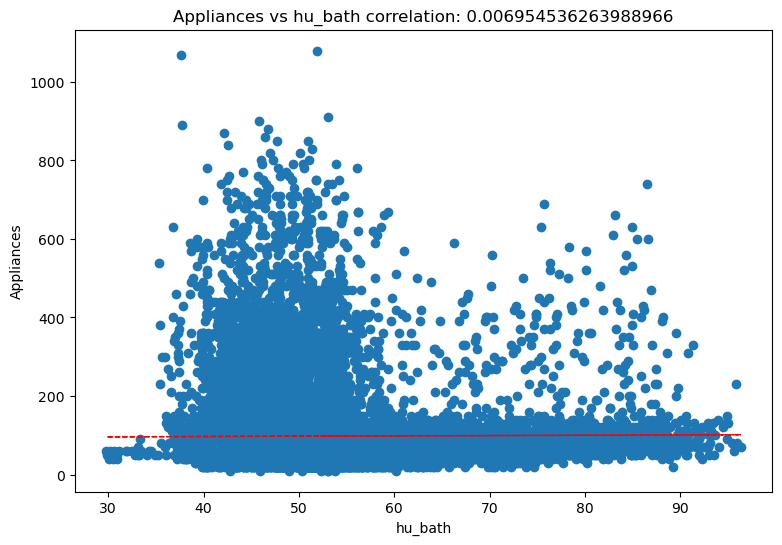

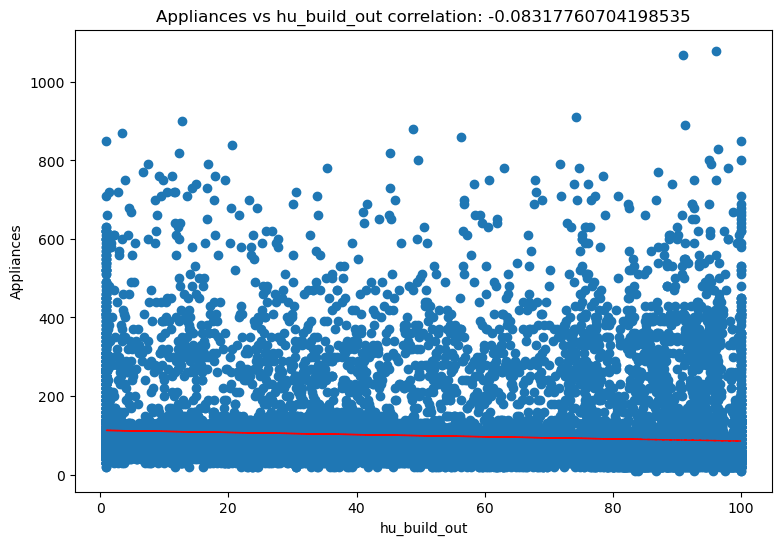

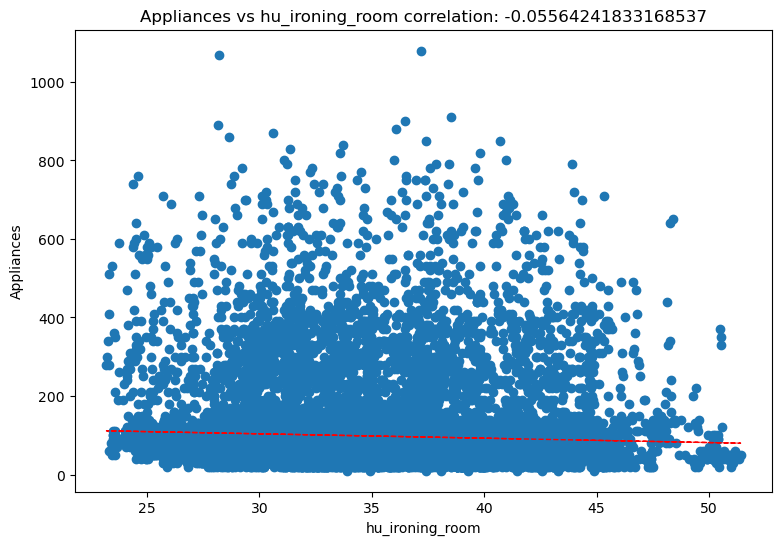

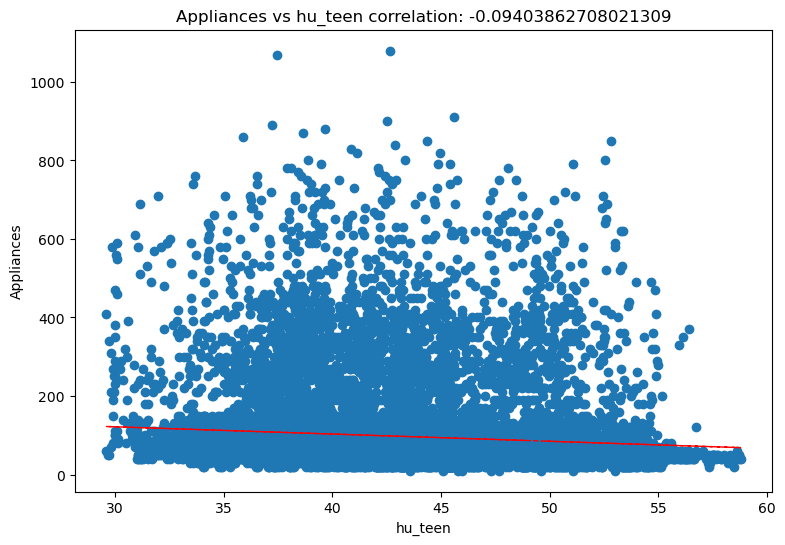

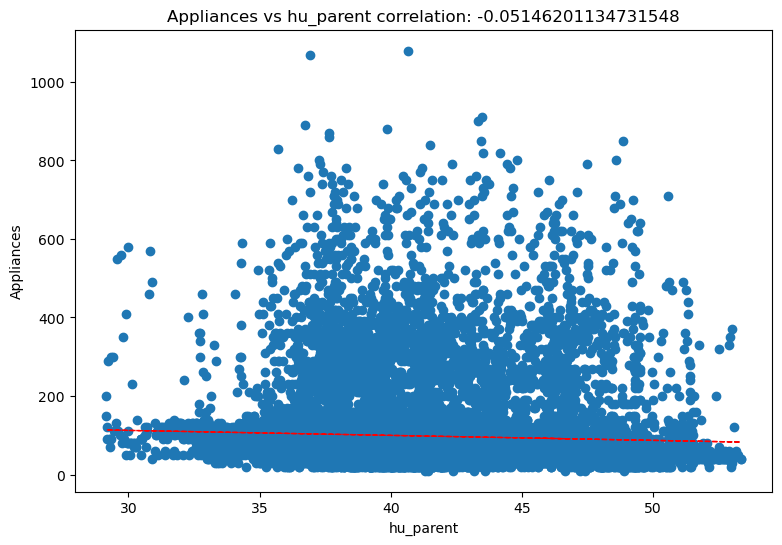

In [123]:
for col in hu_cols[:]:
    fig = plt.figure(figsize = (9, 6))
    ax = fig.gca()

    feature = df_energy[col]
    label = df_energy['Appliances']
    correlation = feature.corr(label)

    plt.scatter(x = feature, y = label)
    plt.xlabel(col)
    plt.ylabel('Appliances')
    ax.set_title('Appliances vs ' + col + ' correlation: ' + str(correlation))

    z = np.polyfit(df_energy[col], df_energy['Appliances'], 1)
    y_hat = np.poly1d(z)(df_energy[col])

    plt.plot(df_energy[col], y_hat, "r--", lw=1)

    plt.show()

In [124]:
for col in hu_cols[:]:
    feature = df_energy[col]

    label = df_energy['Appliances']
    correlation = feature.corr(label)

    print('the colreation of', col, 'with Appliances is', correlation)

the colreation of hu_kitchen with Appliances is 0.0860314253172441
the colreation of hu_living with Appliances is -0.06046476003153631
the colreation of hu_laundry with Appliances is 0.0362917211542806
the colreation of hu_office with Appliances is 0.01696543141766891
the colreation of hu_bath with Appliances is 0.006954536263988966
the colreation of hu_build_out with Appliances is -0.08317760704198535
the colreation of hu_ironing_room with Appliances is -0.05564241833168537
the colreation of hu_teen with Appliances is -0.09403862708021309
the colreation of hu_parent with Appliances is -0.05146201134731548


# Correlation maps of Weather columns

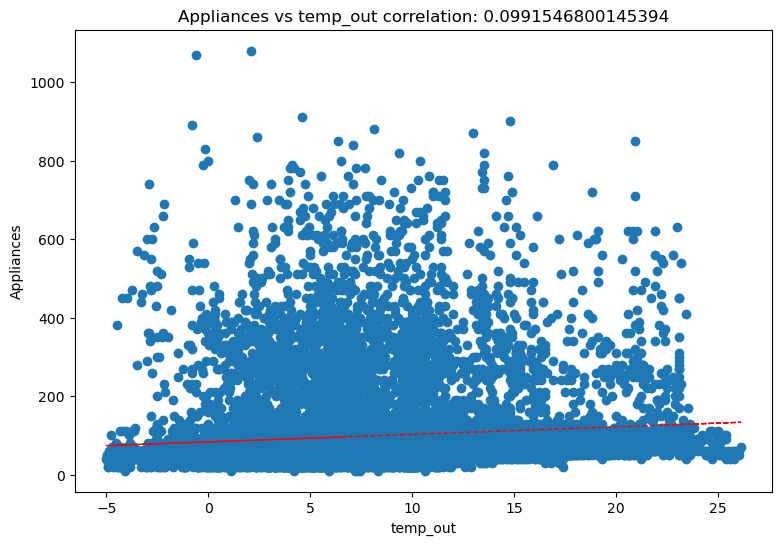

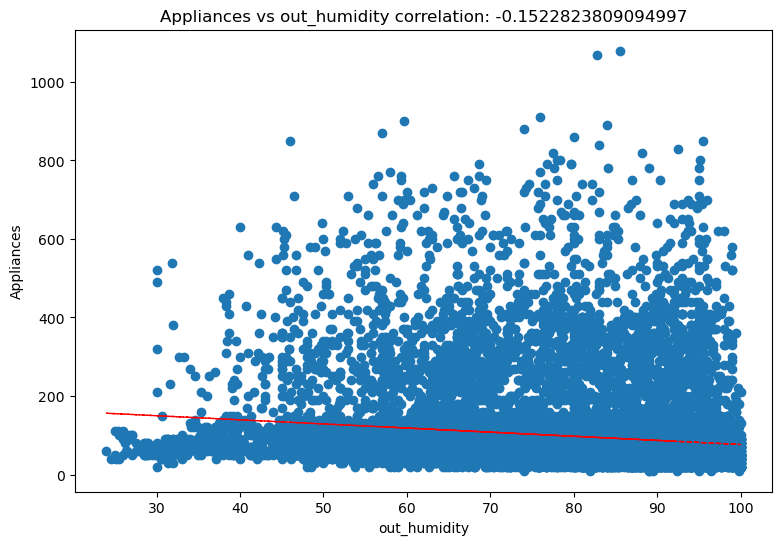

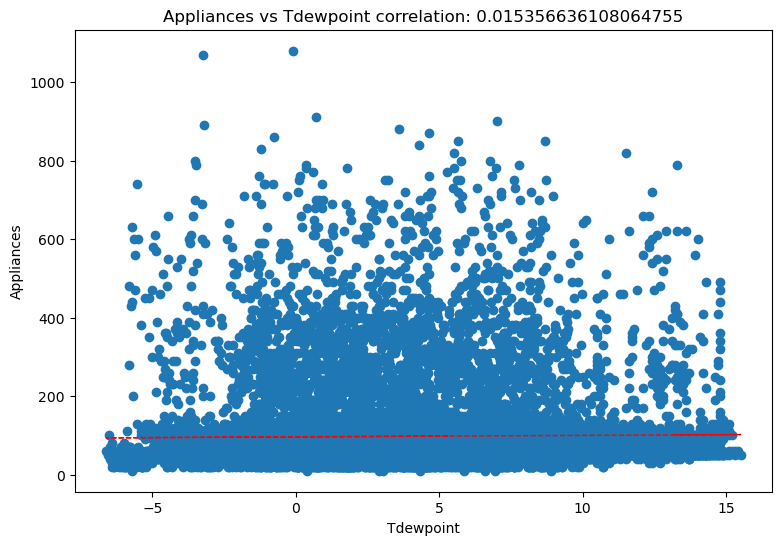

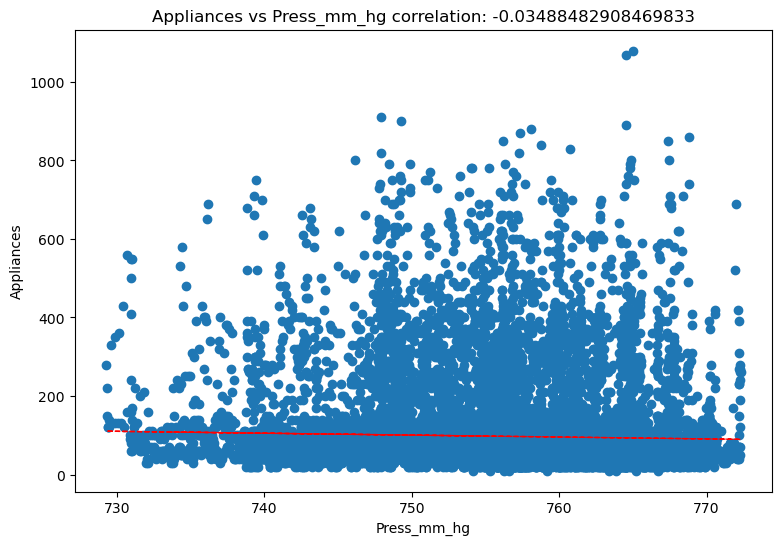

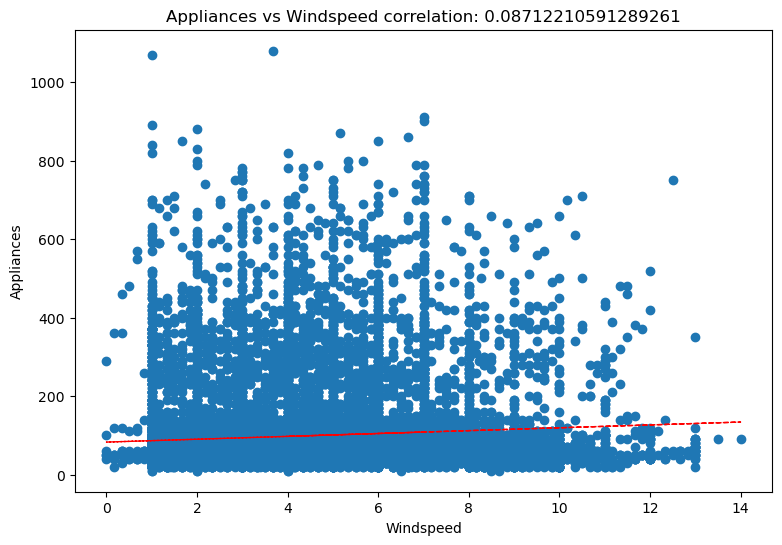

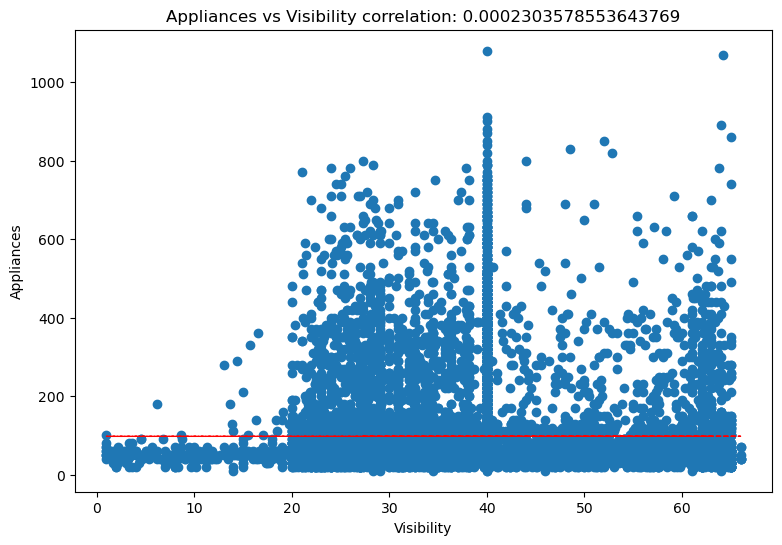

In [125]:
for col in weather_cols[:]:
    fig = plt.figure(figsize=(9,6))

    ax = fig.gca()
    feature = df_energy[col]

    label = df_energy['Appliances']
    correlation = feature.corr(label)

    plt.scatter(x= feature, y = label)
    plt.xlabel(col)

    plt.ylabel('Appliances')
    ax.set_title('Appliances vs ' + col + ' correlation: ' + str(correlation))

    z = np.polyfit(df_energy[col], df_energy['Appliances'], 1)
    y_hat = np.poly1d(z)(df_energy[col])

    plt.plot(df_energy[col], y_hat, "r--", lw=1)

    plt.show()

In [126]:
for col in weather_cols[:]:
    feature = df_energy[col]

    label = df_energy['Appliances']
    correlation = feature.corr(label)

    print('The corealtion of', col, 'with the Appliances is', correlation)

The corealtion of temp_out with the Appliances is 0.0991546800145394
The corealtion of out_humidity with the Appliances is -0.1522823809094997
The corealtion of Tdewpoint with the Appliances is 0.015356636108064755
The corealtion of Press_mm_hg with the Appliances is -0.03488482908469833
The corealtion of Windspeed with the Appliances is 0.08712210591289261
The corealtion of Visibility with the Appliances is 0.0002303578553643769


# Appliance Energy Column

<Axes: xlabel='hour', ylabel='Appliances'>

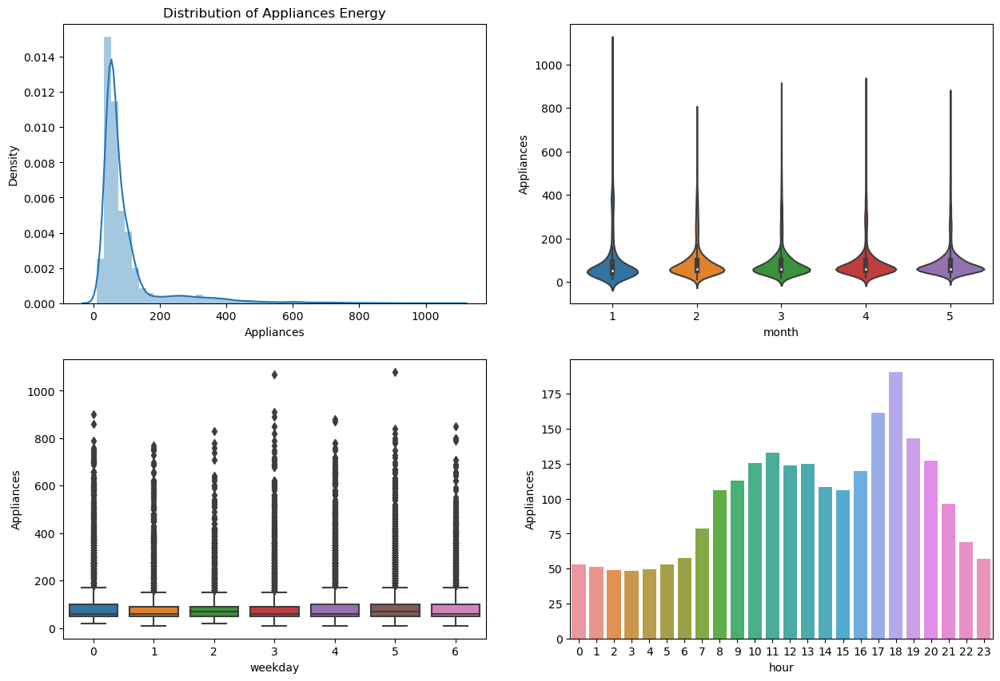

In [127]:
fig,ax = plt.subplots(2,2, figsize = (15,10))

dist = sns.distplot(df_energy['Appliances'], ax = ax[0,0])
dist.set_title('Distribution of Appliances Energy')

#Average Appliances Energy over month
month_eng = pd.DataFrame(df_energy.groupby('month')['Appliances'].mean()).reset_index()

sns.violinplot(x = df_energy['month'], y = df_energy['Appliances'], ax = ax[0,1])

#Average Appliances Energy over weekdays
weekday_eng = pd.DataFrame(df_energy.groupby('weekday')['Appliances'].mean()).reset_index()

sns.boxplot(x = df_energy['weekday'], y = df_energy['Appliances'], ax = ax[1,0])

#Average Appliances Energy over hours
hour_eng = pd.DataFrame(df_energy.groupby('hour')['Appliances'].mean()).reset_index()

sns.barplot(x = hour_eng['hour'], y = hour_eng['Appliances'], ax = ax[1,1])

The reason for using distplot is that it provides a quick overview of the skewness, allowing us to decide whether or not to perform the transformation.   

Violin plots depict summary statistics and the density of each variable.

Box plots are used to show distributions of numeric data values and compare them between multiple groups.

Bar plots enables to compare categorical data in dependency of numerical data

# Conclusion

Appliances Energy has positive skewness. A log transformation can make it normal. Most of the values are around 100 Wh. Outliers are also present in the column.   

In the month of January, the energy usage is high compared to the other months, and February has low energy consumption.

On Thursday and Saturday, the energy usage is high compared to the other days, and Tuesday has low energy consumption.

In the hours of the day, 8 hrs to 21 hrs have high energy consumption.   

In the hours of the day from 10 PM. to 7 PM., 

we can save the most energy and send the excess power to the grid. In the weeks of Tuesday and February, we can save the most money on power usage.

# Pair Plot

<Figure size 2500x2500 with 0 Axes>

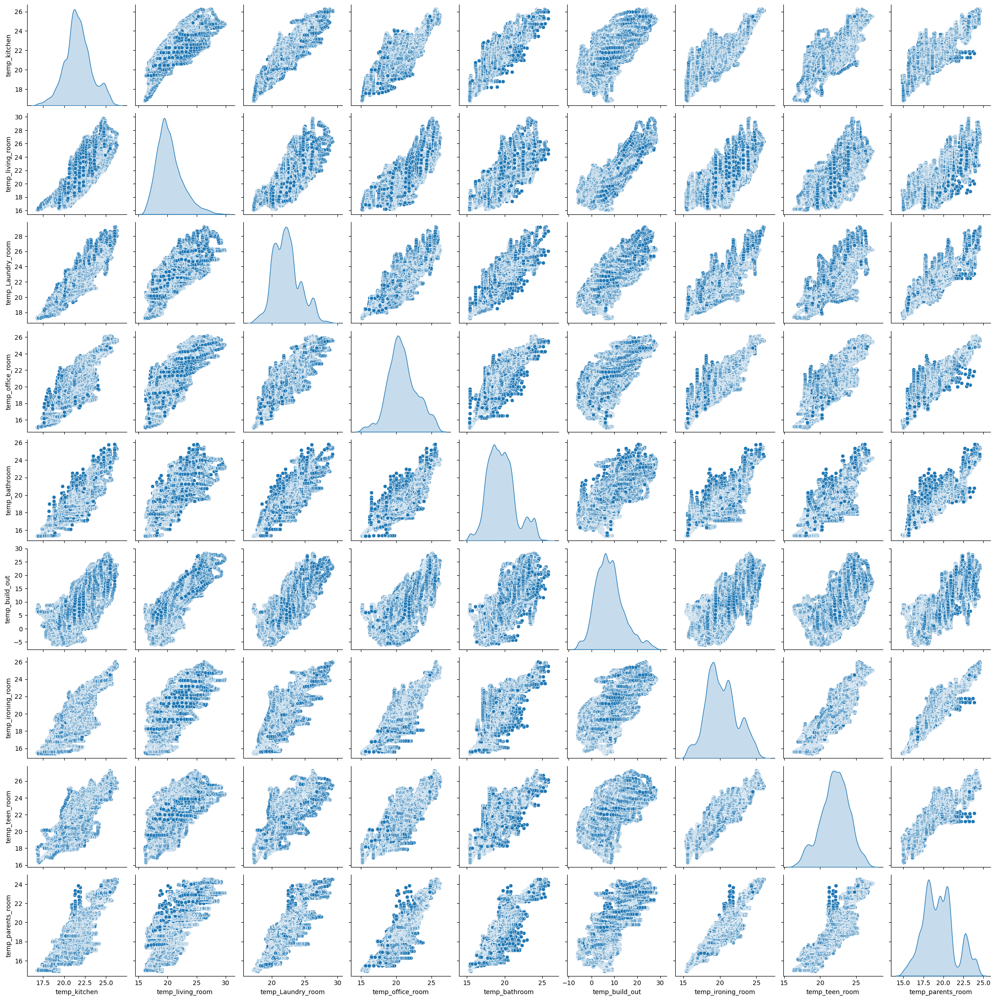

In [128]:
plt.figure(figsize = (25,25))
pair = sns.pairplot(df_energy[temp_cols], diag_kind = 'kde')
plt.show()

<Figure size 2500x2500 with 0 Axes>

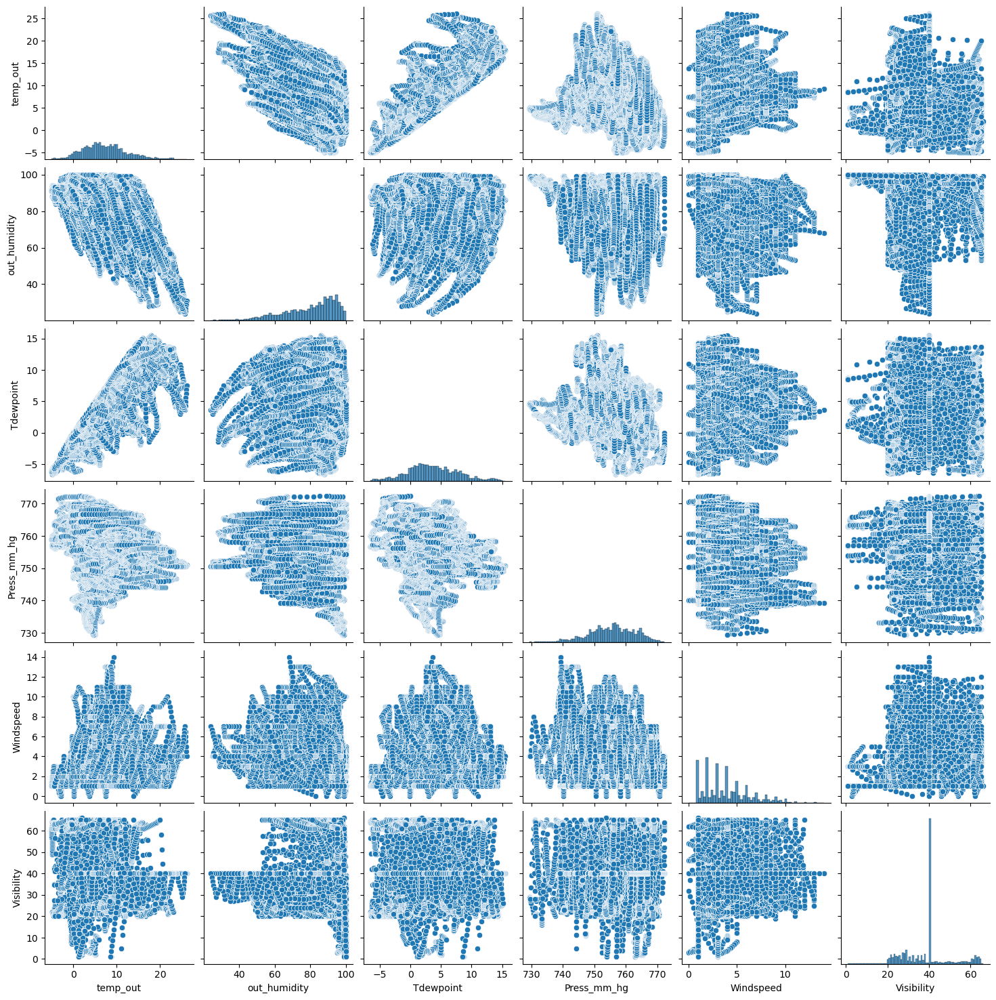

In [129]:
plt.figure(figsize = (25,25))
pair = sns.pairplot(df_energy[weather_cols], diag_kind = 'hist')
plt.show()

# Conclusion

Temperature and Humidity has negative linear relationship
Temperature and Tdewpoint has Positive linear relationship
Temperature may be leads into multicolinearity.


# Hypothesis Testing

Perform an appropriate Statistical Test.

In [130]:
data_weekday = df_energy[df_energy['weekday'] <= 5][['Appliances']]
data_weekend = df_energy[df_energy['weekday'] > 5][['Appliances']]

#Statistics Test and P-value
t_stat, p_val = stats.ttest_ind(data_weekday, data_weekend, equal_var=True)

print('T-Statistics value', t_stat)
print("P-Value", p_val)

T-Statistics value [1.52771504]
P-Value [0.12659933]


In [131]:
data_weekend

,Appliances
762,30
763,40
764,50
765,60
766,50
...,...
19045,60
19046,60
19047,60
19048,60


In [132]:
data_weekday

,Appliances
0,60
1,60
2,50
3,50
4,60
...,...
19730,100
19731,90
19732,270
19733,420


# Perform Statistical Test to obtain P-Value
data_month_1 = df_energy[df_energy['month'] == 1][['Appliances']]
data_month_2 = df_energy[df_energy['month'] == 2][['Appliances']]
data_month_3 = df_energy[df_energy['month'] == 3][['Appliances']]
data_month_4 = df_energy[df_energy['month'] == 4][['Appliances']]
data_month_5 = df_energy[df_energy['month'] == 5][['Appliances']]

#we take a stastic state will compare the any of the 5 months data to all months data to know our hypothesis is true or false
t_stat, p_val = stats.ttest_ind(data_month_1, data_month_4, equal_var=True)

print('T-Statistics value', t_stat)
print("P-Value", p_val)

# Feature Engineering & Data Pre-Processing

1) Handling Missing Values

In [133]:
Missing_values = df_energy.isnull().sum()
Missing_values

Appliances           0
lights               0
temp_kitchen         0
hu_kitchen           0
temp_living_room     0
hu_living            0
temp_Laundry_room    0
hu_laundry           0
temp_office_room     0
hu_office            0
temp_bathroom        0
hu_bath              0
temp_build_out       0
hu_build_out         0
temp_ironing_room    0
hu_ironing_room      0
temp_teen_room       0
hu_teen              0
temp_parents_room    0
hu_parent            0
temp_out             0
Press_mm_hg          0
out_humidity         0
Windspeed            0
Visibility           0
Tdewpoint            0
rv1                  0
rv2                  0
month                0
weekday              0
hour                 0
dtype: int64

2) Handling Outliers

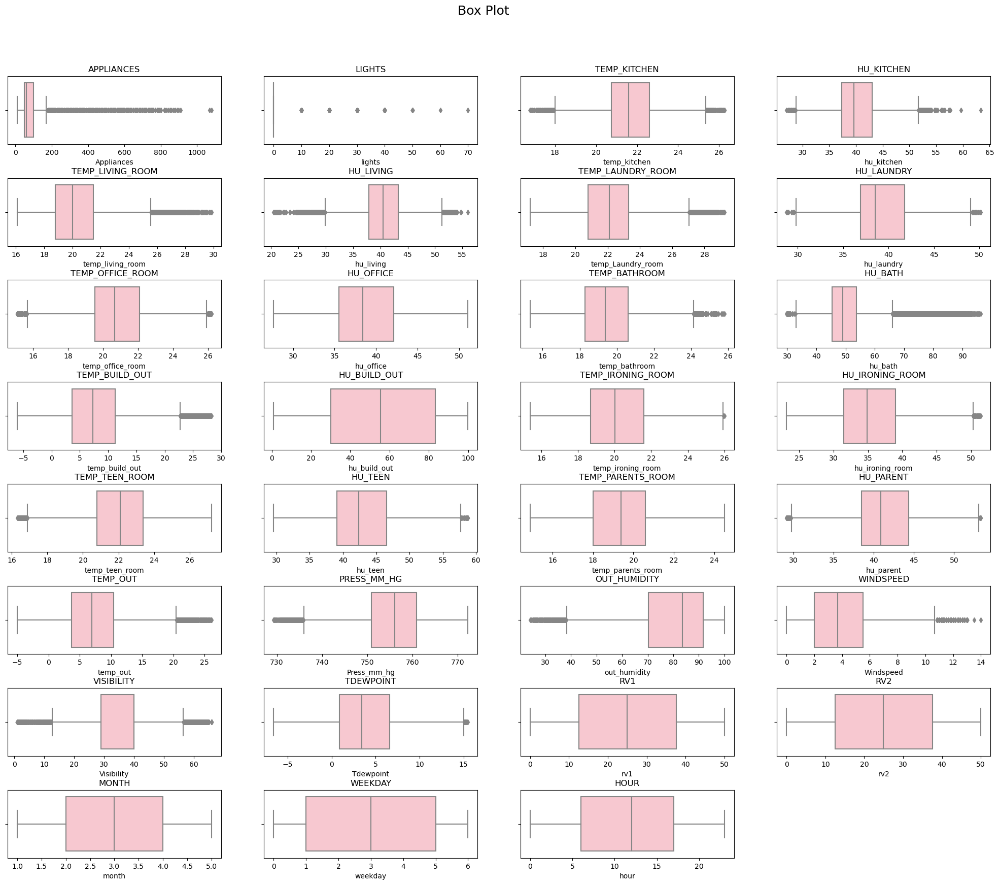

In [134]:
df = df_energy.copy()
col_list = list(df.describe().columns)

plt.figure(figsize = (25, 20))
plt.suptitle("Box Plot", fontsize = 18, y = 0.95)

for n, ticker in enumerate(col_list):
    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace = 0.5, wspace = 0.2)

    sns.boxplot(x = df[ticker], color ='pink', ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

In [135]:
import pandas as pd
import numpy as np

def find_outliers_iqr(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)

    iqr = q3 - q1

    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    outliers_count = (data < lower_bound) | (data > upper_bound)
    num_outliers = outliers_count.sum()

    return num_outliers

outliers_per_column = find_outliers_iqr(df_energy)
print("Number of outliers per column:")

print(outliers_per_column.sort_values(ascending = False))

Number of outliers per column:
lights               4483
Visibility           2522
Appliances           2138
hu_bath              1330
temp_living_room      546
temp_kitchen          515
temp_build_out        515
temp_out              440
out_humidity          239
hu_living             235
Press_mm_hg           219
temp_Laundry_room     217
Windspeed             214
temp_office_room      186
temp_bathroom         179
hu_kitchen            146
temp_teen_room         71
hu_ironing_room        42
hu_parent              21
hu_teen                17
hu_laundry             15
Tdewpoint              11
temp_ironing_room       2
temp_parents_room       0
hu_build_out            0
hu_office               0
rv1                     0
rv2                     0
month                   0
weekday                 0
hour                    0
dtype: int64


Here four columns have highest outliers appliances, light, hu_bathroom, visibility and other have outliers too byt less compared the top 4

In [136]:
for ftr in col_list:
    print(ftr, '\n')
    
    # Calculate the 25th and 75th percentiles
    q_25 = np.percentile(df[ftr], 25)
    q_75 = np.percentile(df[ftr], 75)
    
    # Calculate the Interquartile Range (IQR)
    iqr = q_75 - q_25
    print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (q_25, q_75, iqr))

    # Calculate the outlier cutoff
    cut_off = iqr * 1.5
    lower = q_25 - cut_off
    upper = q_75 + cut_off
    print(f"\nlower = {lower} and upper = {upper} \n")
    
    # Identify outliers
    outliers = [x for x in df[ftr] if x < lower or x > upper]
    print('Identified outliers: %d' % len(outliers))

    # Removing outliers by capping them to lower or upper bounds
    if len(outliers) != 0:
        def bin(row):
            if row[ftr] > upper:
                return upper
            if row[ftr] < lower:
                return lower
            else:
                return row[ftr]

        df[ftr] = df.apply(lambda row: bin(row), axis=1)
        print(f"{ftr} Outliers Removed")

print("\n-------\n")


Appliances 

Percentiles: 25th=50.000, 75th=100.000, IQR=50.000

lower = -25.0 and upper = 175.0 

Identified outliers: 2138
Appliances Outliers Removed
lights 

Percentiles: 25th=0.000, 75th=0.000, IQR=0.000

lower = 0.0 and upper = 0.0 

Identified outliers: 4483
lights Outliers Removed
temp_kitchen 

Percentiles: 25th=20.760, 75th=22.600, IQR=1.840

lower = 18.0 and upper = 25.36 

Identified outliers: 515
temp_kitchen Outliers Removed
hu_kitchen 

Percentiles: 25th=37.333, 75th=43.067, IQR=5.733

lower = 28.73333332000001 and upper = 51.66666667999999 

Identified outliers: 146
hu_kitchen Outliers Removed
temp_living_room 

Percentiles: 25th=18.790, 75th=21.500, IQR=2.710

lower = 14.724999999999998 and upper = 25.565 

Identified outliers: 546
temp_living_room Outliers Removed
hu_living 

Percentiles: 25th=37.900, 75th=43.260, IQR=5.360

lower = 29.86 and upper = 51.3 

Identified outliers: 235
hu_living Outliers Removed
temp_Laundry_room 

Percentiles: 25th=20.790, 75th=23.290, I

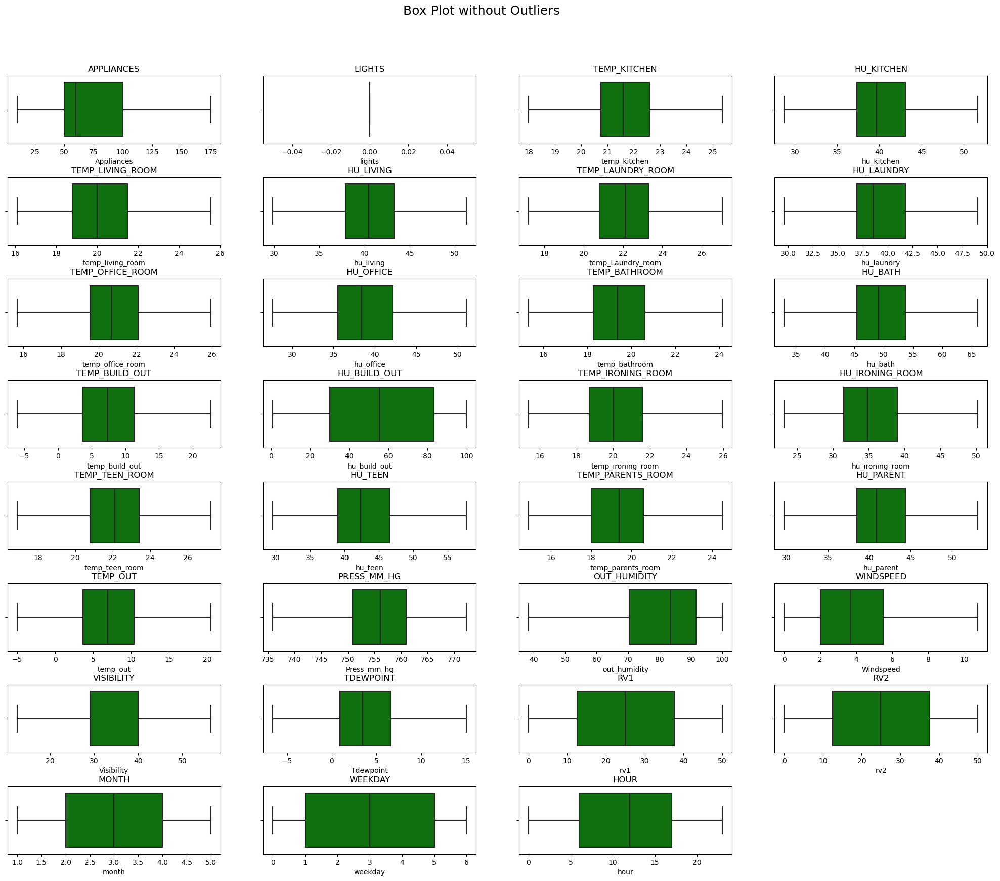

In [137]:
plt.figure(figsize=(25, 20))
plt.suptitle("Box Plot without Outliers", fontsize=18, y=0.95)


for n, ticker in enumerate(col_list):

    ax = plt.subplot(8, 4, n+1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    sns.boxplot(x=df[ticker],color='g', ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

# Feature Manipulation & Selection

Feature Manipulation

In [138]:
df['Average_building_Temperature'] = df[['temp_kitchen', 'temp_living_room', 'temp_Laundry_room', 'temp_office_room', 'temp_bathroom', 'temp_ironing_room', 'temp_teen_room', 'temp_parents_room']].mean(axis=1)

df['Temperature_difference'] = abs(df['Average_building_Temperature'] - df['temp_build_out'])

df['Average_building_humidity'] = df[['hu_kitchen', 'hu_living', 'hu_laundry', 'hu_office', 'hu_bath', 'hu_ironing_room', 'hu_teen', 'hu_parent']].mean(axis=1)

df['Humidity_difference'] = abs(df['hu_build_out'] - df['Average_building_humidity'])

In [139]:
df.drop('rv1', axis=1, inplace=True, errors='ignore')
df.drop('rv2', axis=1, inplace=True, errors='ignore')
df.head()

,Appliances,lights,temp_kitchen,hu_kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,hu_office,...,Windspeed,Visibility,Tdewpoint,month,weekday,hour,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference
0,60.0,0.0,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,7.000000,56.500000,5.3,1,0,17,18.435000,11.408333,46.742500,37.514167
1,60.0,0.0,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,6.666667,56.500000,5.2,1,0,17,18.439167,11.605833,46.672708,37.390625
2,50.0,0.0,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,6.333333,55.333333,5.1,1,0,17,18.421667,11.861667,46.562917,36.593750
3,50.0,0.0,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,6.000000,51.500000,5.0,1,0,17,18.396250,11.962917,46.468750,36.954583
4,60.0,0.0,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,5.666667,47.666667,4.9,1,0,17,18.408750,12.042083,46.462917,38.430417


# Checking Multicollinearity

In [140]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):
    vif = pd.DataFrame()

    vif['varabiles'] = X.columns
    vif['VIF'] = [round(variance_inflation_factor(X.values, i), 2) for i in range(X.shape[1])]

    return (vif)

In [141]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances']]]).sort_values(by = 'VIF', ascending = False)

,varabiles,VIF
1,temp_kitchen,inf
13,temp_ironing_room,inf
30,Average_building_humidity,inf
29,Temperature_difference,inf
28,Average_building_Temperature,inf
18,hu_parent,inf
17,temp_parents_room,inf
2,hu_kitchen,inf
15,temp_teen_room,inf
14,hu_ironing_room,inf


In [142]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances', 'lights','temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','hu_kitchen','hu_living','hu_laundry','hu_office','hu_bath','temp_build_out','Average_building_Temperature']]]).sort_values(by = 'VIF', ascending = False)

,varabiles,VIF
8,Press_mm_hg,1988.31
5,temp_parents_room,1968.37
17,Average_building_humidity,1611.49
1,temp_ironing_room,1605.98
9,out_humidity,1278.31
3,temp_teen_room,908.32
4,hu_teen,717.11
6,hu_parent,677.87
2,hu_ironing_room,537.50
7,temp_out,390.44


In [143]:
df_removed = df[[i for i in df.describe().columns if i not in ['lights', 'temp_kitchen', 'temp_living_room', 'temp_Laundry_room', 'temp_office_room', 'temp_bathroom', 'hu_kitchen', 'hu_living']]]

df_removed.head()


,Appliances,hu_laundry,hu_office,hu_bath,temp_build_out,hu_build_out,temp_ironing_room,hu_ironing_room,temp_teen_room,hu_teen,...,Windspeed,Visibility,Tdewpoint,month,weekday,hour,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference
0,60.0,44.730000,45.566667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,...,7.000000,56.500000,5.3,1,0,17,18.435000,11.408333,46.742500,37.514167
1,60.0,44.790000,45.992500,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,...,6.666667,56.500000,5.2,1,0,17,18.439167,11.605833,46.672708,37.390625
2,50.0,44.933333,45.890000,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,...,6.333333,55.333333,5.1,1,0,17,18.421667,11.861667,46.562917,36.593750
3,50.0,45.000000,45.723333,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,...,6.000000,51.500000,5.0,1,0,17,18.396250,11.962917,46.468750,36.954583
4,60.0,45.000000,45.530000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,...,5.666667,47.666667,4.9,1,0,17,18.408750,12.042083,46.462917,38.430417


# Data Transformation

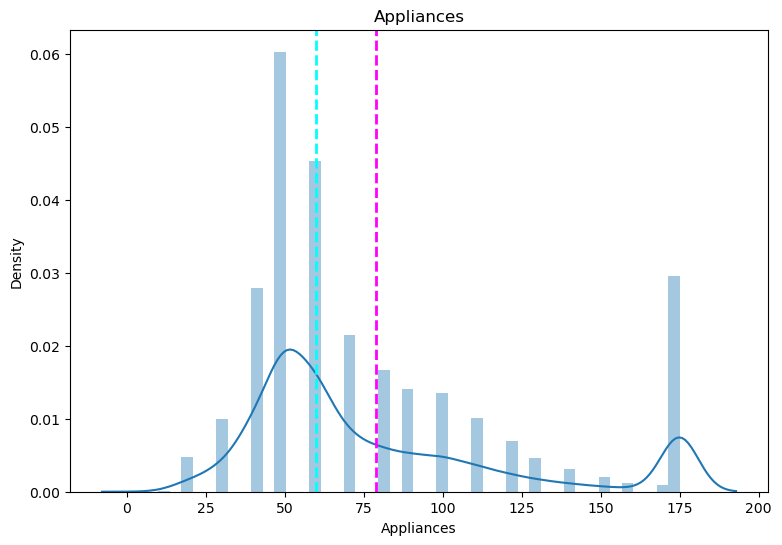

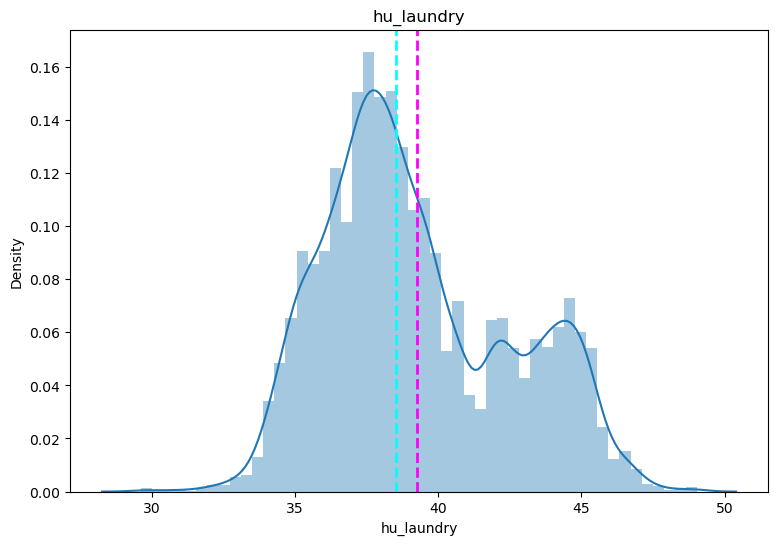

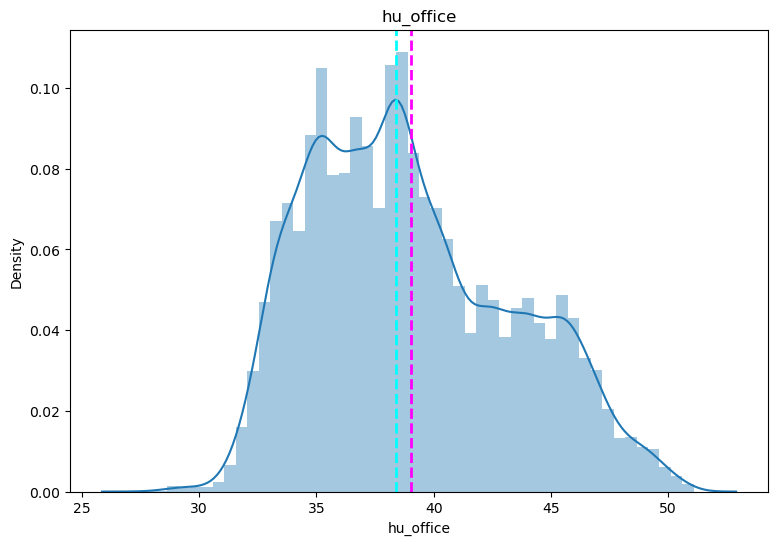

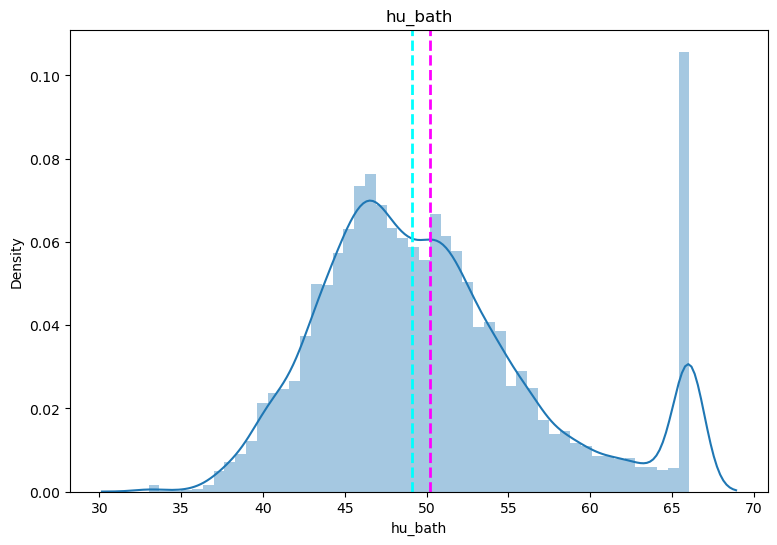

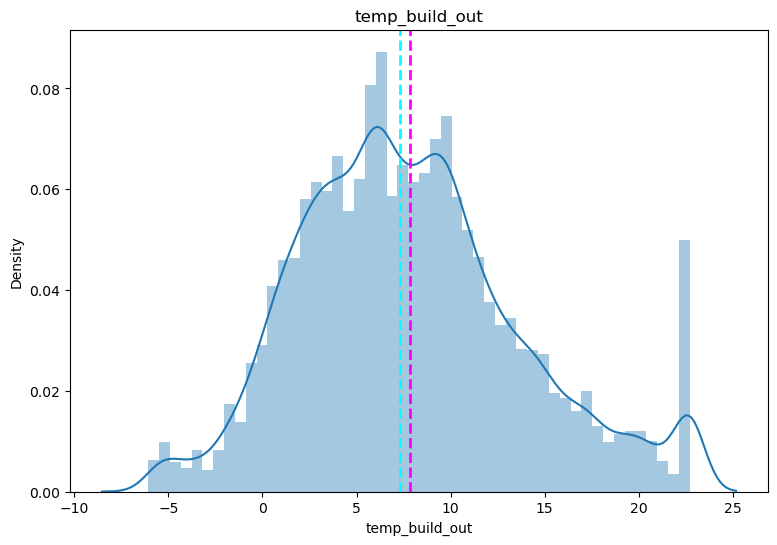

...

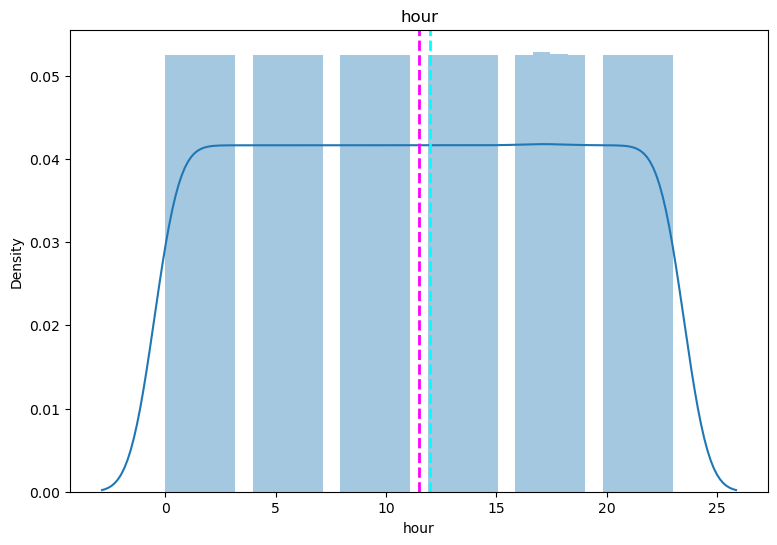

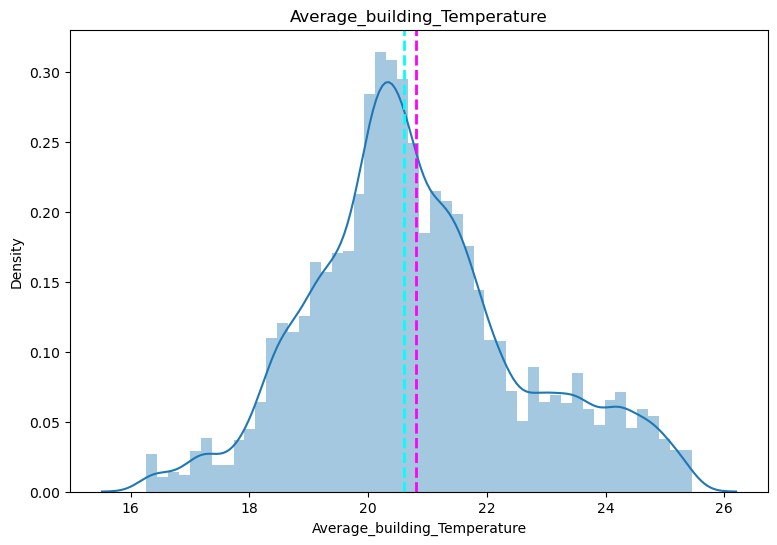

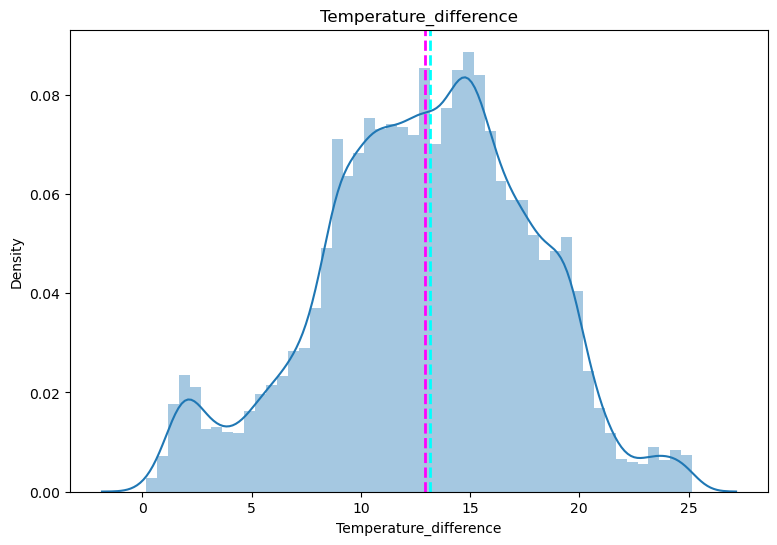

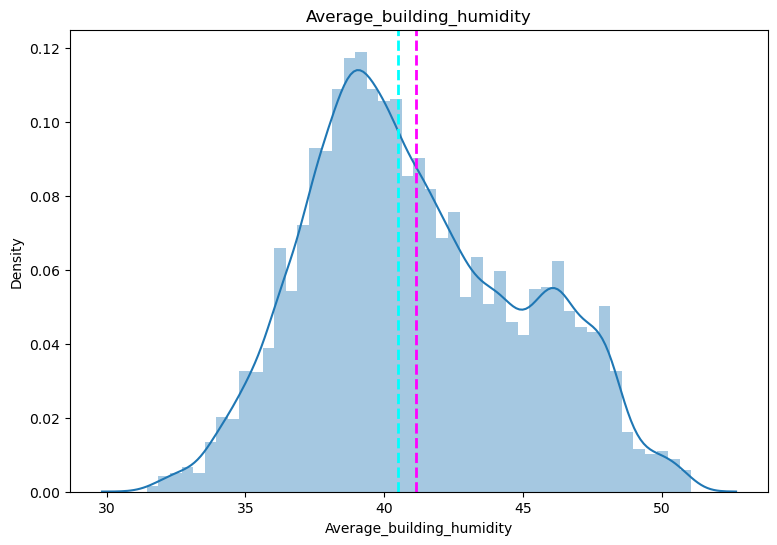

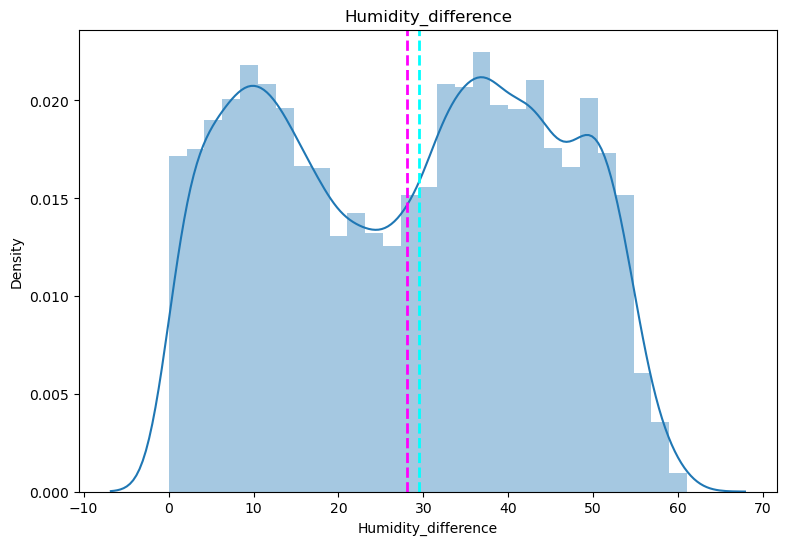

In [144]:
import matplotlib.pyplot as plt
import seaborn as sns

for col in df_removed.describe().columns:
    fig, ax = plt.subplots(figsize=(9, 6))  
    feature = df_removed[col]
    
    sns.distplot(df_removed[col], ax=ax)
    ax.axvline(feature.mean(), color="magenta", linestyle='dashed', linewidth=2)
    ax.axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2)
    ax.set_title(col)
    
    plt.show()


In [145]:
columns = ['Appliances', 'hu_build_out', 'Windspeed', 'Tdewpoint', 'month', 'weekday', 'hour', 'Humidity_difference']
for col in columns:
    skewness = df_removed[col].skew(axis=0, skipna=True)
    print("The skewness of", col, "is", skewness)


The skewness of Appliances is 1.1561567288129546
The skewness of hu_build_out is -0.24196120045297642
The skewness of Windspeed is 0.7901296668539622
The skewness of Tdewpoint is 0.2396438323955805
The skewness of month is -0.06796901264352721
The skewness of weekday is 0.019354272409647544
The skewness of hour is -0.000673050093866728
The skewness of Humidity_difference is -0.029916629674145222


In [146]:
df_removed['Appliances'] = df_removed['Appliances'].apply(lambda x: np.log10(x+1))
df_removed['Windspeed'] = df_removed['Windspeed'].apply(lambda x: np.log10(x+1))


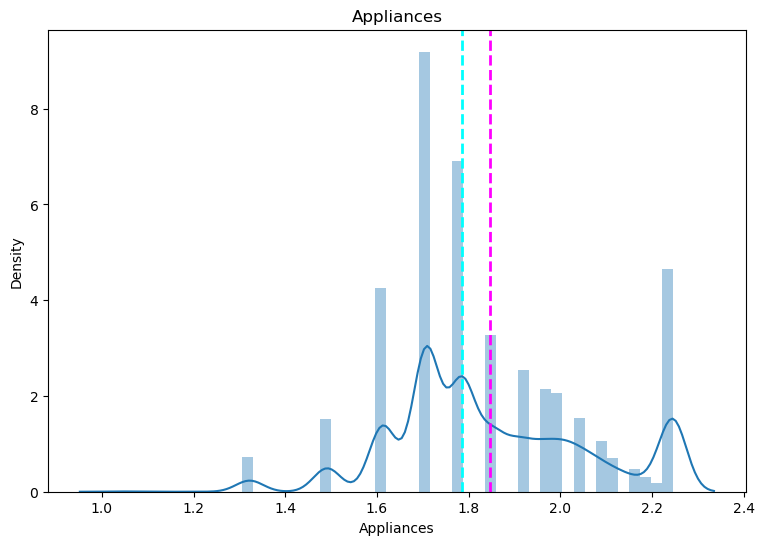

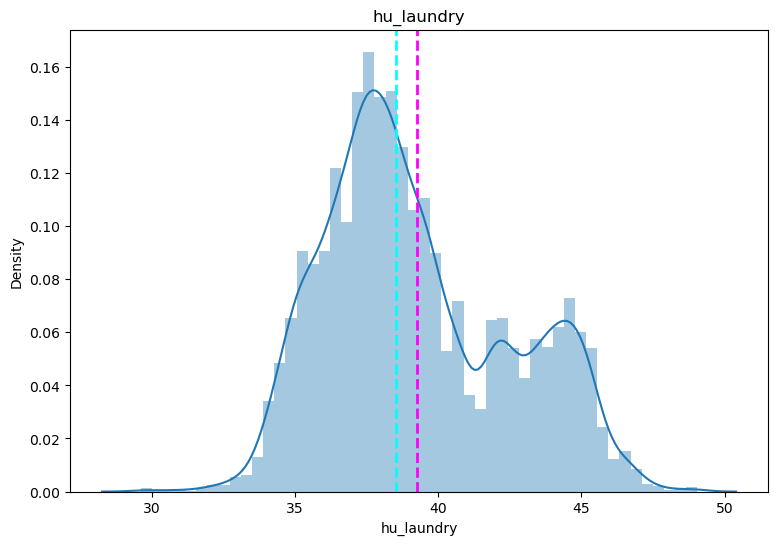

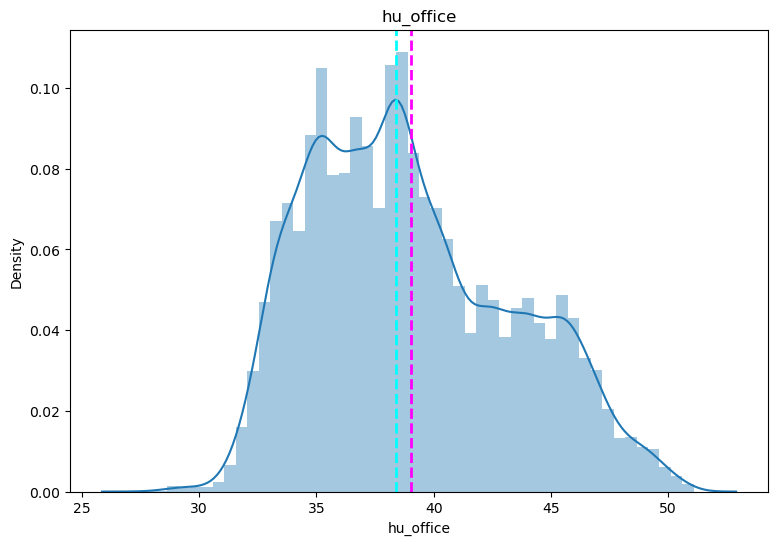

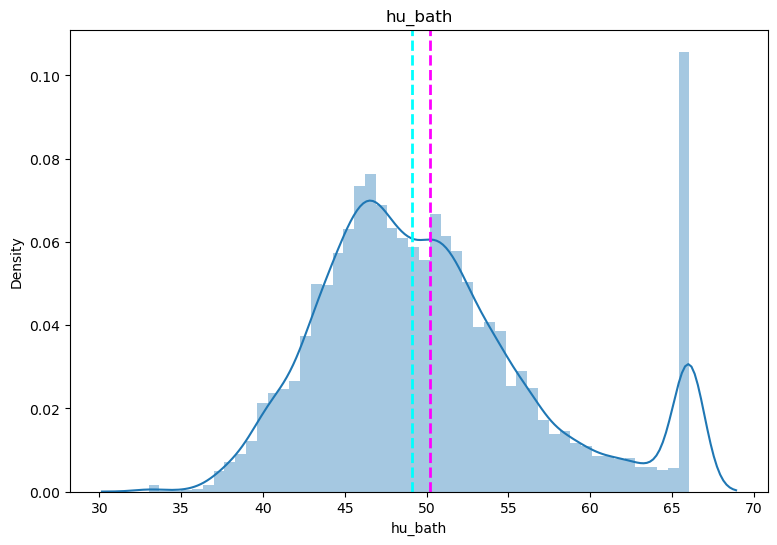

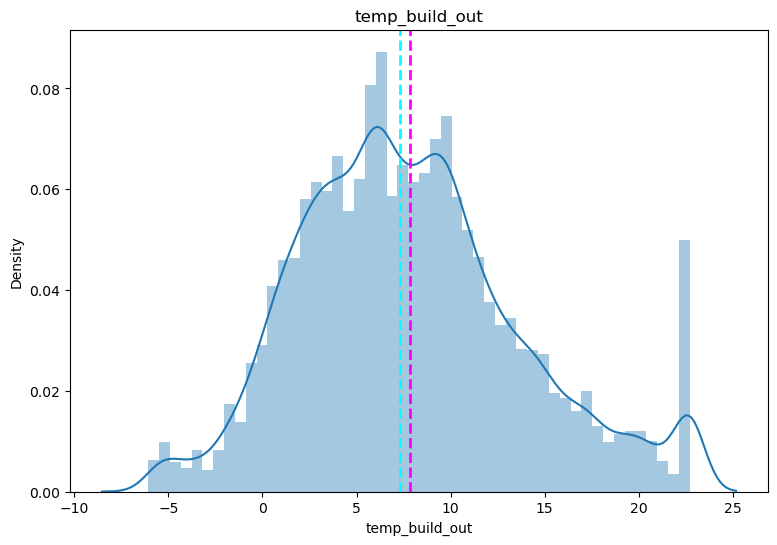

...

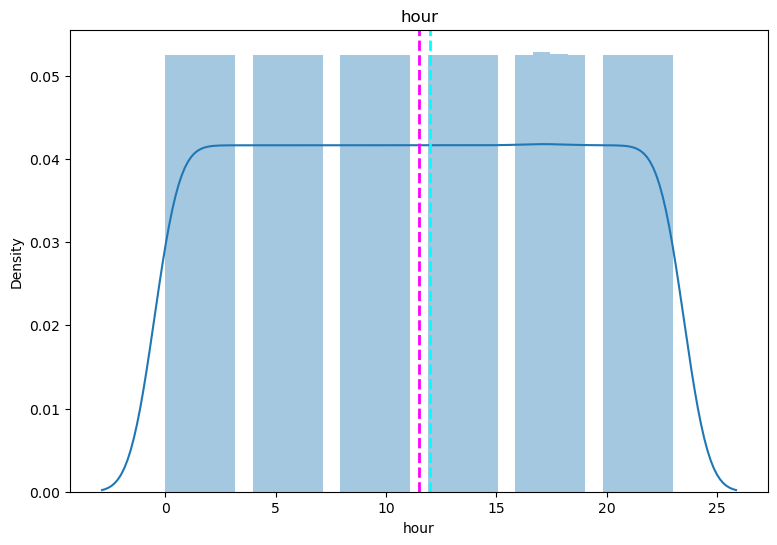

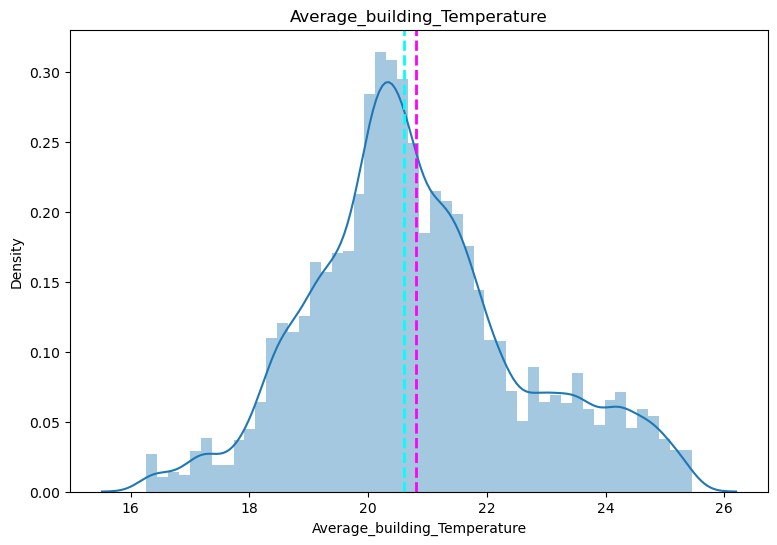

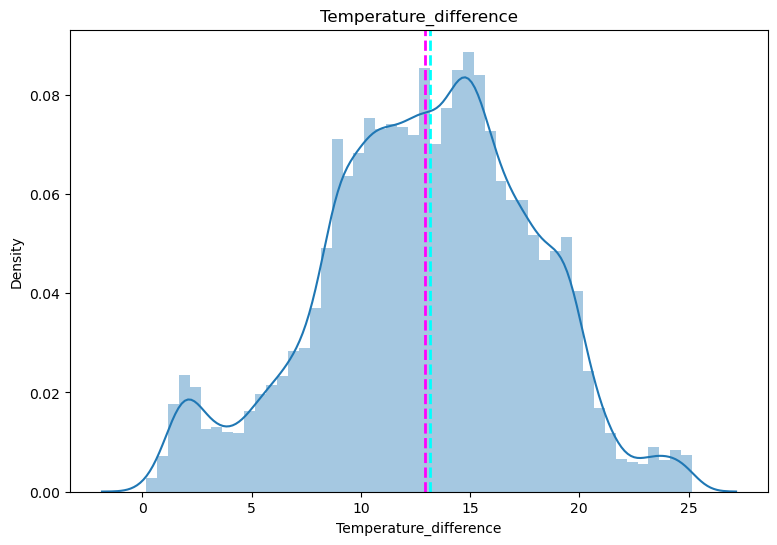

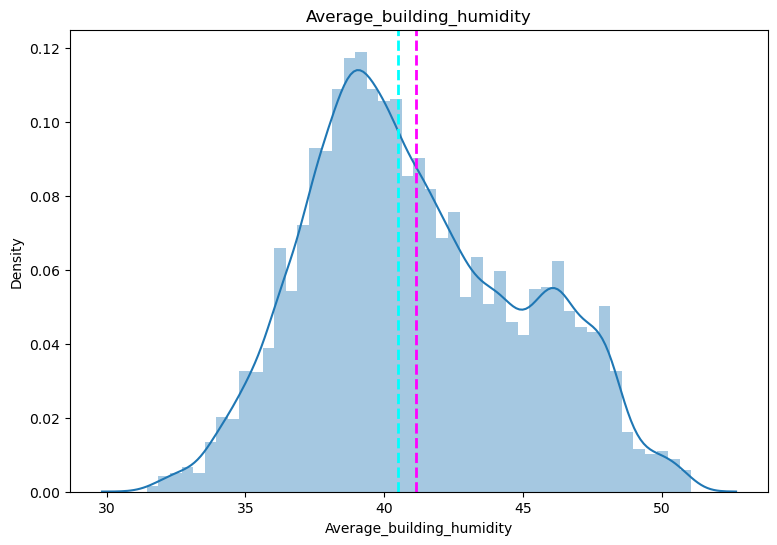

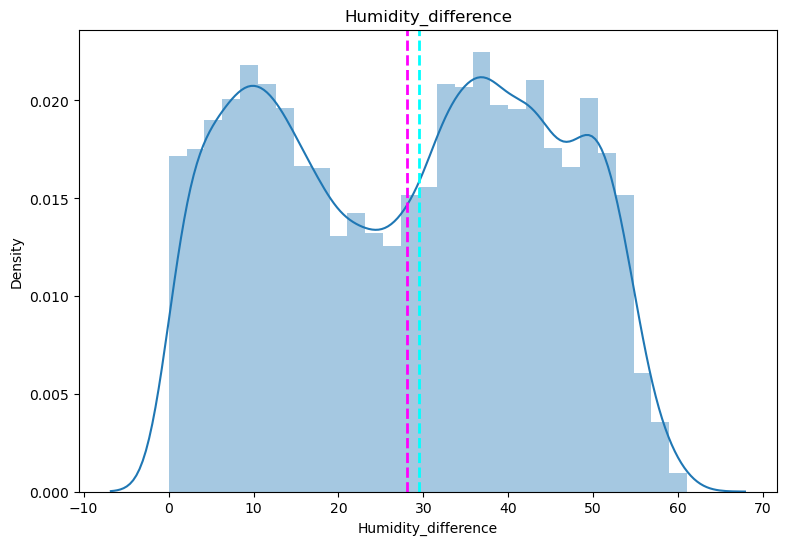

In [147]:
import matplotlib.pyplot as plt
import seaborn as sns

for col in df_removed.describe().columns:
    fig, ax = plt.subplots(figsize=(9, 6))  # Corrected: plt is not reassigned

    feature = df_removed[col]

    sns.distplot(df_removed[col], ax=ax)  # Pass ax to distplot
    ax.axvline(feature.mean(), color='magenta', linestyle='dashed', linewidth=2)
    ax.axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2)
    ax.set_title(col)

plt.show()


# Data Scaling

In [148]:
from scipy.stats import zscore
#scaling data
Features = ['hu_build_out','Windspeed','Tdewpoint','month','weekday','hour','Humidity_difference']
x = df_removed[Features]

In [149]:
y = df_removed['Appliances']

# Data Splitting

In [150]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

print(X_train.shape)
print(X_test.shape)

(15788, 7)
(3947, 7)


In [151]:
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ML Model Implementation

ML Model - 1

In [152]:
from sklearn.linear_model import LinearRegression

# Fit Algorithm
linear_reg = LinearRegression().fit(X_train_scaled, y_train)

print(linear_reg.score(X_train_scaled, y_train))

# Predict on the model
y_pred = linear_reg.predict(X_test_scaled)

from sklearn.metrics import mean_squared_error

MSE = mean_squared_error(10 ** (y_test), 10 ** (y_pred))
print("MSE:", MSE)

RMSE = np.sqrt(MSE)
print("RMSE:", RMSE)

from sklearn.metrics import r2_score

r2 = r2_score(10 ** (y_test), 10 ** (y_pred))

print("R2:", r2)
print("Adjusted R2: ", 1 - (1 - r2_score(10 ** (y_test), 10 ** (y_pred))) * ((X_test.shape[0] - 1) / (X_test.shape[0] - X_test.shape[1] - 1)))

0.18000786828747428
MSE: 1713.3710448871109
RMSE: 41.392886404394545
R2: 0.0798739974774807
Adjusted R2:  0.07823884083425714


In [153]:
# ML Model - 1 Implementation
# LinearRegression
lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

# Predict the target values of train data
lr_train = lr.predict(X_train_scaled)

# Predict the target values for the test data
y_pred_lr = lr.predict(X_test_scaled)

# Evaluate the model using
mse_lr_train = mean_squared_error(y_train, lr_train)
mse_lr_test = mean_squared_error(y_test, y_pred_lr)
r2_lr_train = r2_score(y_train, lr_train)
r2_lr_test = r2_score(y_test, y_pred_lr)

print("LinearRegression Mean Squared Error:", mse_lr_test)
print("LinearRegression R^2 Score:", r2_lr_test)


##Ridge
ridge = Ridge()
# Fit the Ridge model
ridge.fit(X_train_scaled, y_train)
# Predict the target values of train data
r_train = ridge.predict(X_train_scaled)
# Predict values for the test data
y_pred_r = ridge.predict(X_test_scaled)
# Evaluate the model using metrics
mse_r_train = mean_squared_error(y_train, r_train)
mse_r_test = mean_squared_error(y_test, y_pred_r)
r2_r_train = r2_score(y_train, r_train)
r2_r_test = r2_score(y_test, y_pred_r)

print("Ridge Mean Squared Error:", mse_r_test)
print("Ridge R^2 Score:", r2_r_test)


#Lasso
lasso = Lasso()
# Fit the Lasso model on the training data
lasso.fit(X_train_scaled, y_train)
# Predict the target values of train data
l_train = ridge.predict(X_train_scaled)
# Predict the target values for the test data
y_pred_l = lasso.predict(X_test_scaled)
# Evaluate the model using metrics
mse_l_train = mean_squared_error(y_train, l_train)
mse_l_test = mean_squared_error(y_test, y_pred_l)
r2_l_train = r2_score(y_train, l_train)
r2_l_test = r2_score(y_test, y_pred_l)

print("Lasso Mean Squared Error:", mse_l_test)
print("Lasso R^2 Score:", r2_l_test)


LinearRegression Mean Squared Error: 0.0391013749306356
LinearRegression R^2 Score: 0.162149259446149
Ridge Mean Squared Error: 0.039100724449633195
Ridge R^2 Score: 0.16216319772812882
Lasso Mean Squared Error: 0.04667558705445649
Lasso R^2 Score: -0.00014833874094732913


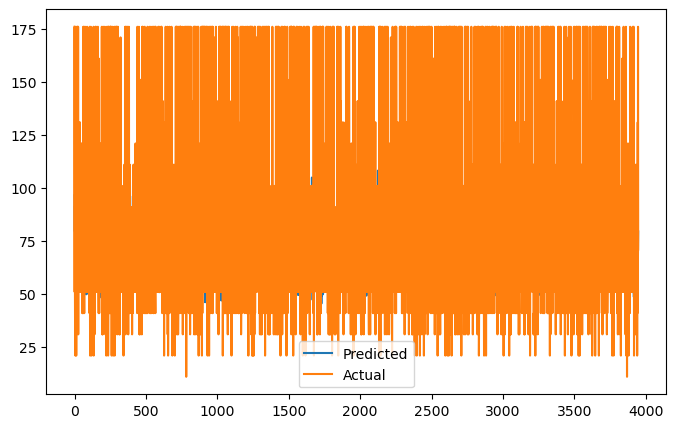

In [154]:
plt.figure(figsize=(8,5))
plt.plot(10**(y_pred_lr))

plt.plot(10**(np.array((y_test))))
plt.legend(["Predicted", "Actual"])

plt.show()

In [155]:
# Visualizing evaluation Metric Score chart
#checking the coefficients

print("The Coefficients obtain from linearrgression model", lr.coef_)
print("The Coefficients obtain from Ridge model", ridge.coef_)

print("The Coefficients obtain from Lasso model", lasso.coef_)

#checking the intercepts
print("The Intercepts obtain from linearrgression model", lr.intercept_)

print("The Intercepts obtain from Ridge model", ridge.intercept_)
print("The Intercepts obtain from Lasso model", lasso.intercept_)

The Coefficients obtain from linearrgression model [-0.12270421  0.07294706  0.02400298 -0.0055683   0.01876485  0.24655944
  0.03641446]
The Coefficients obtain from Ridge model [-0.12252373  0.07290467  0.02393407 -0.00543558  0.01875609  0.24642991
  0.03636822]
The Coefficients obtain from Lasso model [-0.  0.  0.  0.  0.  0. -0.]
The Intercepts obtain from linearrgression model 1.7109303838941
The Intercepts obtain from Ridge model 1.710911808086181
The Intercepts obtain from Lasso model 1.8464620149026625


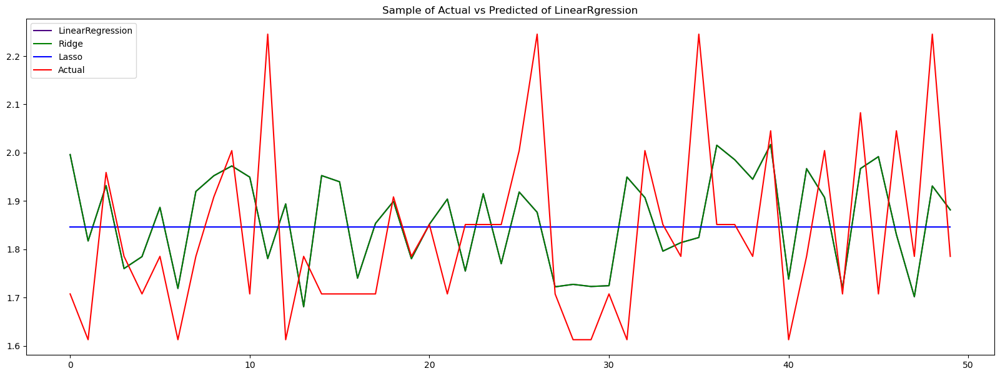

In [156]:
# Visualizing evaluation Metric Score chart
## Plot the predicted vs actual values

plt.figure(figsize=(20,7))
plt.plot(((y_pred_lr) [500:550]), color="indigo")

plt.plot(((y_pred_r) [500:550]), color='green')
plt.plot(((y_pred_l) [500:550]), color='blue')

plt.plot((np.array((y_test) [500:550])), color='red')
plt.legend(["LinearRegression", "Ridge", "Lasso", "Actual"])

plt.title("Sample of Actual vs Predicted of LinearRgression")
plt.show()

# Cross Validation & Hyperparameter Tuning

In [157]:
# ML Model 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# ML Model 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

ridge_params = {'alpha': [0.001, 0.01,0.1,0.5, 1,2,5]}
lasso_params = {'alpha': [0.0001, 0.001,0.01, 0.1,0.2,0.5,1]}

# Create Ridge and Lasso regression objects
ridge = Ridge()
lasso = Lasso()

# Create GridSearchCV objects
ridge_cv = GridSearchCV(ridge, param_grid=ridge_params, scoring='neg_mean_squared_error')
lasso_cv = GridSearchCV(lasso, param_grid=lasso_params, scoring='neg_mean_squared_error')

# Fit the models using GridSearchCV
ridge_cv.fit(X_train_scaled, y_train)
lasso_cv.fit(X_train_scaled, y_train)

# Get the best hyperparameters and fit the models again using the best hyperparameters
ridge_best = Ridge(alpha=ridge_cv.best_params_['alpha']).fit(X_train_scaled, y_train)
lasso_best = Lasso(alpha=lasso_cv.best_params_['alpha']).fit(X_train_scaled, y_train)

# Predict the train data using the best models
y_train_ridge = ridge_best.predict(X_train_scaled)
y_train_lasso = lasso_best.predict(X_train_scaled)

# Predict values for the test data using the best models
y_pred_ridge = ridge_best.predict(X_test_scaled)
y_pred_lasso = lasso_best.predict(X_test_scaled)


# Evaluate

mse_ridge_train = mean_squared_error(y_train, y_train_ridge)
mse_ridge_test = mean_squared_error(y_test, y_pred_ridge)
r2_ridge_train = r2_score(y_train, y_train_ridge)
r2_ridge_test = r2_score(y_test, y_pred_ridge)
mse_lasso_train = mean_squared_error(y_train, y_train_lasso)
mse_lasso_test = mean_squared_error(y_test, y_pred_lasso)
r2_lasso_train = r2_score(y_train, y_train_lasso)
r2_lasso_test = r2_score(y_test, y_pred_lasso)

# Print the evaluation metrics for both models
print("Ridge Regression")
print("Best Alpha:", ridge_cv.best_params_['alpha'])
print("Ridge Mean Squared Error:", mse_ridge_test)
print("Ridge R^2 Score:", r2_ridge_test)
mse_percent_ridge = mse_ridge_test * 100
r2_percent_ridge = r2_ridge_test * 100

print("Ridge - Mean squared error: {:.2f}%".format(mse_percent_ridge))
print("Ridge - R-squared: {:.2f}%".format(r2_percent_ridge))

print("\nLasso Regression - Best Alpha:", lasso_cv.best_params_['alpha'])
print("Lasso Mean Squared Error:", mse_lasso_test)
print("Lasso R^2 Score:", r2_lasso_test)

mse_percent_lasso = mse_lasso_test * 100
r2_percent_lasso = r2_lasso_test * 100

print("Lasso - Mean squared error: {:.2f}%".format(mse_percent_lasso))
print("Lasso - R-squared: {:.2f}%".format(r2_percent_lasso))

Ridge Regression
Best Alpha: 5
Ridge Mean Squared Error: 0.03909823143654826
Ridge R^2 Score: 0.1622166171504159
Ridge - Mean squared error: 3.91%
Ridge - R-squared: 16.22%

Lasso Regression - Best Alpha: 0.0001
Lasso Mean Squared Error: 0.03908998023193939
Lasso R^2 Score: 0.16239342110946509
Lasso - Mean squared error: 3.91%
Lasso - R-squared: 16.24%


In [158]:
#create a list of metric score of linear regression
list_lr=['LinearRegression', mse_l_train,mse_l_test, r2_l_train, r2_l_test]

score = pd.DataFrame(columns = ['Model', 'Train MSE', 'Test MSE', 'Train R2_Score', 'Test R2_Score'])
score.loc[len(score)]=list_lr
list_ridge=['Ridge', mse_ridge_train,mse_ridge_test,r2_ridge_train,r2_ridge_test]
score.loc[len(score)]=list_ridge
list_lasso=['Lasso', mse_lasso_train,mse_lasso_test, r2_lasso_train, r2_lasso_test]
score.loc[len(score)]=list_lasso

print(score)

              Model  Train MSE  Test MSE  Train R2_Score  Test R2_Score
0  LinearRegression   0.038228  0.046676        0.180008      -0.000148
1             Ridge   0.038228  0.039098        0.180006       0.162217
2             Lasso   0.038229  0.039090        0.179974       0.162393


# Conclusion

In this code, the GridSearchCV hyperparameter optimisation technique was employed. GridSearchCV was chosen because it thoroughly searches through a specific hyperparameter space to discover the ideal hyperparameters that would result in the greatest model performance.
It is a frequently used method for hyperparameter optimisation that assures that the optimal hyperparameters are identified within the defined parameter space. 

we can see some improvement in the Ridge regression model. The MSE reduced from 0.03908 to 0.03907, but the R-squared score climbed from 0.1622 to 0.1623. However, following hyperparameter optimisation, the MSE of the Lasso regression model increases somewhat from 0.04667 to 0.03907. The R-squared score, on the other hand, increased from -0.00013 to 0.1625.

# ML Model - 2

In [159]:
from sklearn.linear_model import ElasticNet

# alpha = a + b and l1_ratio = a / (a + b)
elasticnet = ElasticNet(alpha=0.1, l1_ratio=0.5)

elasticnet.fit(X_train_scaled, y_train)

y_pred_en = elasticnet.predict(X_test)

MSE = mean_squared_error(10**(y_test), 10**(y_pred_en))
print("MSE:", MSE)

RMSE = np.sqrt(MSE)
print("RMSE:", RMSE)

r2 = r2_score(10**(y_test), 10**(y_pred_en))
print("R2", r2)

print("Adjusted R2:", 1-(1-r2_score(10**(y_test), 10**(y_pred_en)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MSE: 1963.211979982422
RMSE: 44.308148008943256
R2 -0.05429725606490843
Adjusted R2: -0.05617084854839516


Explain the ML Model used and it's Performance using Evaluation Metric Score Chart.

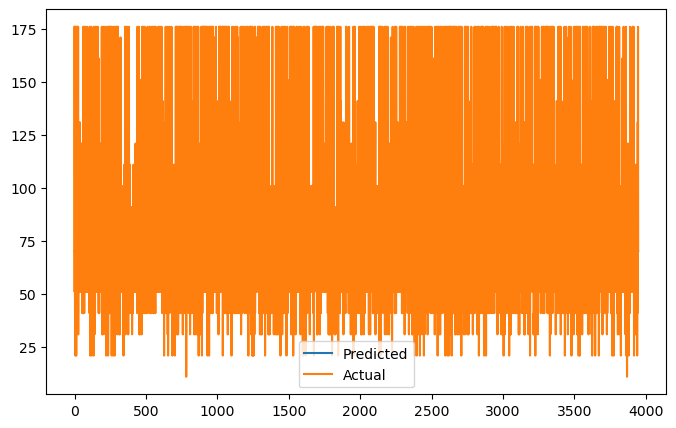

In [160]:
plt.figure(figsize=(8,5))
plt.plot(10**(y_pred_en))
plt.plot(np.array(10**(y_test)))
plt.legend(["Predicted", "Actual"])
plt.show()

Cross Validation & Hyperparameter Tuning

In [161]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
elastic = ElasticNet()
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100], 'l1_ratio':[0.3,0.4,0.5,0.6,0.7,0.8]}
elastic_regressor = GridSearchCV(elastic, parameters, scoring='neg_mean_squared_error',cv=5)
elastic_regressor.fit(X_train_scaled, y_train)

print("The best fit alpha value is found out to be :" ,elastic_regressor.best_params_)
print("\nUsing ",elastic_regressor.best_params_ , " the negative mean squared error is: ", elastic_regressor.best_score_)

y_pred_elastic = elastic_regressor.predict(X_test_scaled)
MSE = mean_squared_error(10**(y_test), 10**(y_pred_elastic))
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :", RMSE)

r2 = r2_score(10**(y_test), 10**(y_pred_elastic))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score(10**(y_test), 10**(y_pred_elastic)))*((X_test_scaled.shape[0]-1)/(X_test_scaled.shape[0]-X_test_scaled.shape[1]-1)))

y_train_elastic=elastic_regressor.predict(X_train_scaled)

mse_en_train = mean_squared_error(y_train, y_train_elastic)
mse_en_test = mean_squared_error(y_test, y_pred_elastic)
r2_en_train = r2_score(y_train, y_train_elastic)
r2_en_test = r2_score(y_test, y_pred_elastic)


The best fit alpha value is found out to be : {'alpha': 0.0001, 'l1_ratio': 0.8}

Using  {'alpha': 0.0001, 'l1_ratio': 0.8}  the negative mean squared error is:  -0.03825822451821514
MSE : 1713.9995166713536
RMSE : 41.40047725173411
R2 : 0.07953649134752772
Adjusted R2 :  0.07790073492189498


In [162]:
#list of decion tree regressor metric score
dtr_list=['Elasticnet',mse_en_train,mse_en_test,r2_en_train,r2_en_test]
score.loc[len(score)]=dtr_list
score

,Model,Train MSE,Test MSE,Train R2_Score,Test R2_Score
0,LinearRegression,0.038228,0.046676,0.180008,-0.000148
1,Ridge,0.038228,0.039098,0.180006,0.162217
2,Lasso,0.038229,0.039090,0.179974,0.162393
3,Elasticnet,0.038229,0.039090,0.179981,0.162392


# ML Model - 3

In [163]:
#decision tree model
model = DecisionTreeRegressor(random_state = 42)

model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

mse_DT = mean_squared_error(y_test, y_pred)
r2_DT = r2_score(y_test, y_pred)

print("Mean squared error: ", mse_DT)
print("R-squared: ", r2_DT)

Mean squared error:  0.021884886100242473
R-squared:  0.5310582285519958


Explain the ML Model used and it's Performance using Evaluation Metric Score Chart.

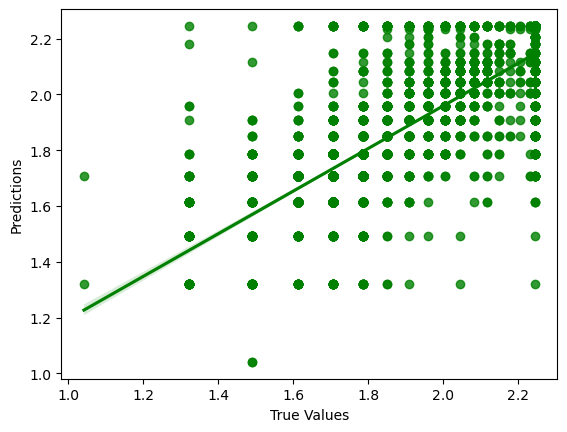

In [164]:
sns.regplot (x = y_test, y = y_pred, color = 'green')

plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

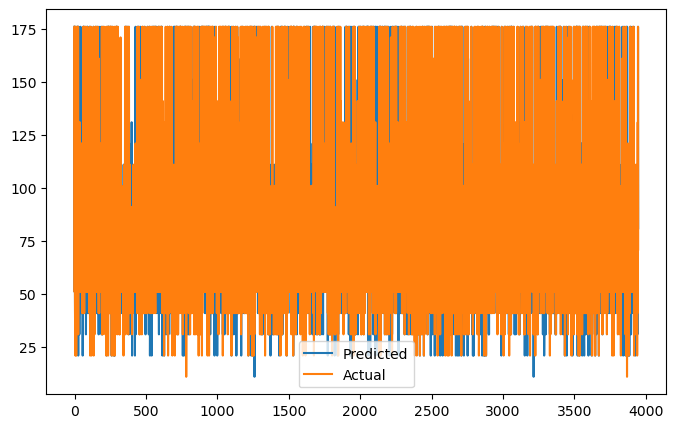

In [165]:
plt.figure(figsize = (8,5))
plt.plot(10**(y_pred))
plt.plot(np.array(10**(y_test)))
plt.legend(["Predicted", "Actual"])
plt.show()

Cross Validation & Hyperparameter Tuning

In [166]:
h_param= {'max_depth': [None, 15, 20, 25],
          'min_samples_split': [20, 25, 30],
          'min_samples_leaf': [4, 8, 12]}

grid_search = GridSearchCV(model, h_param, cv=5, scoring='neg_mean_squared_error')

grid_search.fit(X_train_scaled, y_train)
print('Best parameters:', grid_search.best_params_)

dt_best = DecisionTreeRegressor(max_depth=grid_search.best_params_['max_depth'],
                                min_samples_split=grid_search.best_params_['min_samples_split'],
                                min_samples_leaf=grid_search.best_params_['min_samples_leaf'],
                                random_state=0)

dt_best.fit(X_train_scaled, y_train)

dtr_train = dt_best.predict(X_train_scaled)
y_pred = dt_best.predict(X_test_scaled)

mse_dsT_train = mean_squared_error(y_train, dtr_train)
mse_dsT_test = mean_squared_error(y_test, y_pred)
r2_dsT_train = r2_score(y_train, dtr_train)
r2_dsT_test = r2_score(y_test, y_pred)

print("Mean squared error (Test): ", mse_dsT_test)
print("R-squared (Test): ", r2_dsT_test)


Best parameters: {'max_depth': None, 'min_samples_leaf': 8, 'min_samples_split': 20}
Mean squared error (Test):  0.019707726708023652
R-squared (Test):  0.5777096471353644


In [167]:
dtr_list=['DecisionTree', mse_dsT_train,mse_dsT_test, r2_dsT_train, r2_dsT_test]
score.loc[len(score)] = dtr_list
score

,Model,Train MSE,Test MSE,Train R2_Score,Test R2_Score
0,LinearRegression,0.038228,0.046676,0.180008,-0.000148
1,Ridge,0.038228,0.039098,0.180006,0.162217
2,Lasso,0.038229,0.039090,0.179974,0.162393
3,Elasticnet,0.038229,0.039090,0.179981,0.162392
4,DecisionTree,0.011196,0.019708,0.759839,0.577710


# Conclusion

In this code, I've utilized the GridSearchCV hyperparameter optimization approach. GridSearchCV was chosen because it thoroughly searches through a specific hyperparameter space to discover the ideal hyperparameters that result in the greatest model performance. It is a frequently used method for hyperparameter optimization that ensures the optimal hyperparameters are discovered within the defined parameter space.

# ML Model - 4 Extra Tree Regression

In [169]:
model = ExtraTreesRegressor(random_state=42)

model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

mse_br = mean_squared_error(y_test, y_pred)
r2_br = r2_score(y_test, y_pred)

print("Mean squared error: ", mse_br)
print("R-squared: ", r2_br)

Mean squared error:  0.012415137194697596
R-squared:  0.7339727334113477


Explain the ML Model used and it's Performance using Evaluation Metric Score Chart.

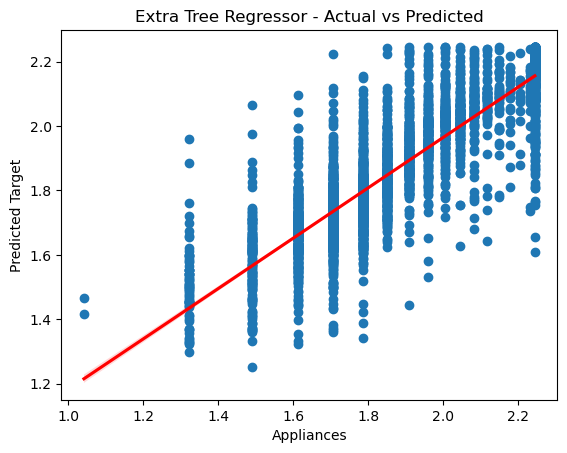

In [170]:
plt.scatter(y_test, y_pred)

plt.xlabel('Actual Target')
plt.ylabel('Predicted Target')

plt.title('Extra Tree Regressor - Actual vs Predicted')
sns.regplot(x = y_test, y = y_pred, scatter = False, color ='red')

plt.show()

Cross Validation & Hyperparameter Tuning

In [177]:
# Hyperparameter tuning
h_params = {
    'max_depth': [70, None],
    'max_features': ['sqrt'],
    'n_estimators': [100]
}


# GridSearchCV
random_search = RandomizedSearchCV(model, h_params, n_iter=10, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
random_search.fit(X_train_scaled, y_train)

print('Best parameters:', random_search.best_params_)

br_best = random_search.best_estimator_

# Fit the model
br_best.fit(X_train_scaled, y_train)

# Predict on the training model
br_train = dt_best.predict(X_train_scaled)

# Predict on the test model
y_pred = br_best.predict(X_test_scaled)
# Evaluate the model
mse_br_train = mean_squared_error(y_train, br_train)
mse_br_test = mean_squared_error(y_test, y_pred)
r2_br_train = r2_score(y_train, br_train)
r2_br_test = r2_score(y_test, y_pred)

print("Mean squared error: ", mse_br_test)
print("R-squared: ", r2_br_test)

Best parameters: {'n_estimators': 100, 'max_features': 'sqrt', 'max_depth': 70}
Mean squared error:  0.012321760618500764
R-squared:  0.7359735743959854


In [179]:
br_list=['ExtraTreeRegressor', mse_br_train,mse_br_test, r2_br_train, r2_br_test]
score.loc[len(score)] = br_list
score

,Model,Train MSE,Test MSE,Train R2_Score,Test R2_Score
0,LinearRegression,0.038228,0.046676,0.180008,-0.000148
1,Ridge,0.038228,0.039098,0.180006,0.162217
2,Lasso,0.038229,0.039090,0.179974,0.162393
3,Elasticnet,0.038229,0.039090,0.179981,0.162392
4,DecisionTree,0.011196,0.019708,0.759839,0.577710
5,ExtraTreeRegressor,0.011196,0.012322,0.759839,0.735974


There is very small improvement in the evaluation metrics after implementing hyperparameter optimization techniques. The mean squared error has decreased from 0.01241 to 0.01232 and the R-squared value has increased from 0.7339 to 0.7359

In these circumstances, the evaluation metrics we examined for a good business impact were as follows:

Mean Squared Error (MSE): MSE is a measure of the average squared difference between the actual and anticipated values of the target variable. A lower MSE suggests that the model performed better in terms of prediction accuracy.   
The R2 Score: R2 Score is a statistical measure that shows the proportion of the variance in the target variable that can be explained by the independent variables. It indicates the model's goodness of fit. A higher R2 Score indicates a better fit of the model to the data and better prediction abilities.  

<Axes: title={'center': 'R2 Score Results'}, xlabel='Model'>

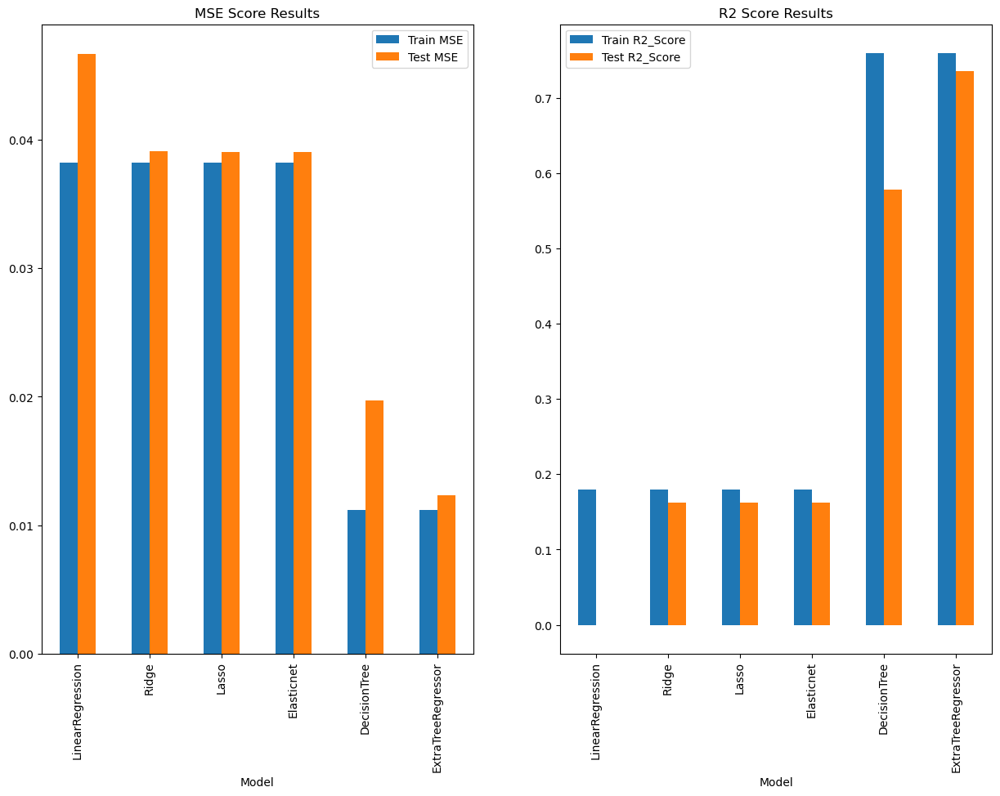

In [180]:
fig, ax = plt.subplots(1, 2, figsize=(15, 10))

score.plot(x="Model", y=['Train MSE', 'Test MSE'], kind="bar", title='MSE Score Results', ax=ax[0])

score.plot(x="Model", y=['Train R2_Score', 'Test R2_Score'], kind="bar", title='R2 Score Results', ax=ax[1])

The ExtraTreeRegressor MODEL outperformed the other three models in terms of MEAN SQUARED ERROR and R-SQUARED value, with the lowest MSE and highest R-SQUARED value.
As a result, I'd go with the ExtraTreeRegressor model as the final prediction model.

# Conclusion

1)Linear Regression, Lasso Regression, Ridge Regression, Decision Tree Regressor, ElasticNet, Extra Tree Regressor are used to predict household appliance energy consumption.
2)We compare and evaluate the best model with the lowest error and the greatest R-squared score after suitable preprocessing and fitting the fourteen models.
3)temp_build_out and temp_out, temp_parents_room and temp_ironing_room had a high association with each other, thus we deleted temp_build_out and temp_parents_room. When examining the influence of the Random Variable attribute, the linear models assigned the random variable near zero weights, negating its influence in predicting the target variable. 
4)Inside room temperature and humidity has high variance inflation factor (VIF) so, we had to drop them.
5)Light consumption was evaluated highly when all factors were used. When evaluating different predictor subgroups, eliminating light usage did not appear to have a substantial influence. This could indicate that other characteristics are well connected with light energy usage.
6)The pressure's significant prediction power could be attributed to its influence on wind speed and higher rainfall probability, which could potentially raise the occupancy of the residence.
7)Because this dataset involves a temporal component, we believe that employing Temporal Series Analysis techniques will result in superior results.
8)Extra TreeRegressor was discovered to be the best performing model, with an R-squared value of 0.7339.